In [2]:
!pip install stockstats
!pip install pyarrow
!pip install torchinfo
!pip install wandb

     |████████████████████████████████| 1.8 MB 5.3 MB/s 
     |████████████████████████████████| 144 kB 32.2 MB/s 
     |████████████████████████████████| 181 kB 44.1 MB/s 
     |████████████████████████████████| 63 kB 1.8 MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=403049bd0fd16b317cf407f7568d2562f0a0498293eb35a3a46596f0f5d1ce3e
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built pathtools


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go
import plotly

import string
import datetime
from tqdm.auto import tqdm

from sklearn.preprocessing import LabelEncoder, StandardScaler
from stockstats import StockDataFrame
import warnings
import re
import nltk

sns.set(style='darkgrid', font_scale=1.3, palette='Set2')
plotly.offline.init_notebook_mode()

In [4]:
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [5]:
FEE = 0.001

NEWS_DIR = 'data_crypto/'
PRICES_DIR = 'data_crypto_prices/'
MODELS_DIR = 'best_models/'
PLOTS_DIR = 'plots/'
MAIN_DIR = './'

In [6]:
from google.colab import drive
drive.mount('/content/drive')

NEWS_DIR = '/content/drive/MyDrive/Investing/Colab/data_crypto/'
PRICES_DIR = '/content/drive/MyDrive/Investing/Colab/data_crypto_prices/'
MODELS_DIR = '/content/drive/MyDrive/Investing/Colab/best_models/'
PLOTS_DIR = '/content/drive/MyDrive/Investing/Colab/plots/'
MAIN_DIR = '/content/drive/MyDrive/Investing/Colab/'

Mounted at /content/drive


In [7]:
tickers = ['BTC']  # , 'ETH', 'LTC', 'XRP']

news = {
    ticker: pd.read_csv(NEWS_DIR + ticker + '.csv', 
                        parse_dates=['date'], 
                        index_col='date')
    for ticker in tickers
}
prices = {
    ticker: pd.read_csv(PRICES_DIR + ticker + '.csv', 
                        parse_dates=['date'], 
                        index_col='date') 
    for ticker in tickers
}

In [8]:
prices['BTC']

,unix,symbol,open,high,low,close,Volume BTC,Volume USD
date,,,,,,,,
2015-01-01 00:01:00+00:00,1420070460,BTC/USD,321.00,321.00,321.00,321.00,0.000000,0.000000
2015-01-01 00:02:00+00:00,1420070520,BTC/USD,321.00,321.00,321.00,321.00,1.413333,453.679999
2015-01-01 00:03:00+00:00,1420070580,BTC/USD,321.00,321.00,321.00,321.00,2.000000,642.000000
2015-01-01 00:04:00+00:00,1420070640,BTC/USD,320.98,320.98,320.43,320.43,2.843880,911.264468
2015-01-01 00:05:00+00:00,1420070700,BTC/USD,320.50,320.51,320.49,320.50,8.255000,2645.727500
...,...,...,...,...,...,...,...,...
2022-03-22 03:23:00+00:00,1647919380,BTC/USD,42313.73,42359.62,42300.00,42352.89,1.220523,51692.695844
2022-03-22 03:24:00+00:00,1647919440,BTC/USD,42320.51,42320.51,42276.17,42316.05,0.611748,25886.739490
2022-03-22 03:25:00+00:00,1647919500,BTC/USD,42305.08,42309.82,42294.32,42294.32,0.141064,5966.219491


In [9]:
def rename(name):
    is_other = all(c in string.hexdigits for c in name)
    if is_other:
        return 'Other'
    return name


for news_fd in news.values():
    news_fd['source'] = news_fd['source'].apply(rename)

news['BTC']

,ticker,source,title,body,link
date,,,,,
2017-06-12 12:03:00+00:00,bitcoin,investing-new,Top 5 things to watch today,\nInvesting.com - Wall Street tech giants set ...,https://www.investing.com/news/economy-news/to...
2017-06-13 15:06:00+00:00,bitcoin,investing-new,"Bitcoin pushes higher, Ethereum lower","\n\n\n© Reuters. Bitcoin pushes higher, Ethere...",https://www.investing.com/news/forex-news/bitc...
2017-06-13 19:29:00+00:00,bitcoin,investing-new,'Cryptomania' resumes as Bitcoin regains momentum,"\n\n\nBitcoin resumed its march back to $3,000...",https://www.investing.com/news/forex-news/-39;...
2017-06-14 18:51:00+00:00,bitcoin,investing-new,Bitcoin dips after hitting technical resistance,\n\n\n© Reuters. \n\n\nInvesting.com - Bitcoin...,https://www.investing.com/news/forex-news/bitc...
2017-06-15 12:33:00+00:00,bitcoin,investing-new,"Bitcoin, Ethereum plunge as much as 25% as bul...","\n\n\n© Reuters. Bitcoin, Ethereum plunge by a...",https://www.investing.com/news/forex-news/bitc...
...,...,...,...,...,...
2022-03-18 17:40:00+00:00,bitcoin,Other,Stranded no more? Bitcoin miners could help so...,\n\n\n© Reuters. \n\n\nThe energy usage and en...,https://www.investing.com/news/cryptocurrency-...
2022-03-18 18:20:00+00:00,bitcoin,Other,"Price analysis 3/18: BTC, ETH, BNB, XRP, LUNA,...",\n\n\n\n\n\nBitcoin (BTC) is facing a challeng...,https://www.investing.com/news/cryptocurrency-...
2022-03-18 19:20:00+00:00,bitcoin,Other,Paxful partners with Miami mayor to give away ...,\n\n\n© Reuters \n\n\nDigital payment platform...,https://www.investing.com/news/cryptocurrency-...


In [10]:
def show_prices():
    fig = go.Figure()

    for ticker in tickers:
        subdata = prices[ticker].resample('1h')['open'].last().dropna()

        fig.add_trace(
            go.Scattergl(
                x=subdata.index, 
                y=subdata,
                mode='lines',
                name=ticker,
            )
        )

    fig.show(renderer="colab")
    # fig.show()
    
show_prices()

In [11]:
news_btc = news['BTC'].drop_duplicates()
prices_btc = prices['BTC'].loc['2017-06-01':]

## Работа с данными

### Предобработка данных

In [ ]:
K = [6, 14, 26, 42]
columns = ['open', 'close', 'volume']

INDICATORS_K = [[
    f'rsi_{k}', f'stochrsi_{k}', f'vr_{k}',
    f'wr_{k}', f'cci_{k}', f'atr_{k}', f'vwma_{k}', f'chop_{k}',
    f'macd_{k}_ema', f'macds_{k}_ema', f'macdh_{k}_ema', 
    f'macd_{k}_mstd', f'macds_{k}_mstd', f'macdh_{k}_mstd', 
    f'mfi_{k}', f'kdjk_{k}', f'kdjd_{k}', f'kdjj_{k}', 
] for k in K]

INDICATORS_COLUMNS = [[
    f'{column}_{k}_ema', f'{column}_{k}_mstd', 
    f'{column}_{k}_smma', f'{column}_{k}_sma', 
    f'{column}_{k}_mvar', 
    f'{column}_{k}_trix', f'{column}_{k}_tema',
] for column in columns for k in K]

INDICATORS = sum(INDICATORS_K, []) + sum(INDICATORS_COLUMNS, []) + [
    'wt1', 'wt2', 'dma',
    'supertrend', 'supertrend_ub', 'supertrend_lb',
    'pdi', 'mdi', 'dx', 'adx', 'adxr',
    'cr', 'cr-ma1', 'cr-ma2', 'cr-ma3',
    'boll', 'boll_ub', 'boll_lb',
    'macd', 'macds', 'macdh',
    'ppo', 'ppos', 'ppoh',
    'volume', 'open', 'close', 'high', 'low',
]
print(INDICATORS)

['rsi_6', 'stochrsi_6', 'vr_6', 'wr_6', 'cci_6', 'atr_6', 'vwma_6', 'chop_6', 'macd_6_ema', 'macds_6_ema', 'macdh_6_ema', 'macd_6_mstd', 'macds_6_mstd', 'macdh_6_mstd', 'mfi_6', 'kdjk_6', 'kdjd_6', 'kdjj_6', 'rsi_14', 'stochrsi_14', 'vr_14', 'wr_14', 'cci_14', 'atr_14', 'vwma_14', 'chop_14', 'macd_14_ema', 'macds_14_ema', 'macdh_14_ema', 'macd_14_mstd', 'macds_14_mstd', 'macdh_14_mstd', 'mfi_14', 'kdjk_14', 'kdjd_14', 'kdjj_14', 'rsi_26', 'stochrsi_26', 'vr_26', 'wr_26', 'cci_26', 'atr_26', 'vwma_26', 'chop_26', 'macd_26_ema', 'macds_26_ema', 'macdh_26_ema', 'macd_26_mstd', 'macds_26_mstd', 'macdh_26_mstd', 'mfi_26', 'kdjk_26', 'kdjd_26', 'kdjj_26', 'rsi_42', 'stochrsi_42', 'vr_42', 'wr_42', 'cci_42', 'atr_42', 'vwma_42', 'chop_42', 'macd_42_ema', 'macds_42_ema', 'macdh_42_ema', 'macd_42_mstd', 'macds_42_mstd', 'macdh_42_mstd', 'mfi_42', 'kdjk_42', 'kdjd_42', 'kdjj_42', 'open_6_ema', 'open_6_mstd', 'open_6_smma', 'open_6_sma', 'open_6_mvar', 'open_6_trix', 'open_6_tema', 'open_14_ema',

In [ ]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    DROP_COLUMNS = ["unix", "symbol", "Volume USD"]
    RENAME_COLUMNS = {"Volume BTC": "volume"}

    result_dataset = prices_btc.copy()

    result_dataset.drop(DROP_COLUMNS, axis=1, inplace=True)
#     result_dataset.reset_index(inplace=True)
    result_dataset.rename(RENAME_COLUMNS, axis=1, inplace=True)

    result_dataset = StockDataFrame(result_dataset)
    result_dataset = result_dataset[INDICATORS]
    result_dataset = result_dataset.join(result_dataset.ewm(alpha=0.3, min_periods=10).mean(), rsuffix="_ewm")
    result_dataset = result_dataset.fillna(method="ffill").dropna() \
                                   .replace([np.inf, -np.inf], method='ffill') \
                                   .resample('1min').ffill()

result_dataset.reset_index().to_feather(PRICES_DIR + 'BTC_indocators.feather')
result_dataset

,rsi_6,stochrsi_6,vr_6,wr_6,cci_6,atr_6,vwma_6,chop_6,macd_6_ema,macds_6_ema,...,macds_ewm,macdh_ewm,ppo_ewm,ppos_ewm,ppoh_ewm,volume_ewm,open_ewm,close_ewm,high_ewm,low_ewm
date,,,,,,,,,,,,,,,,,,,,,
2017-06-01 00:11:00+00:00,55.908712,40.674788,343.912674,-21.244310,-20.900693,4.099492,2304.307824,34.166821,0.210387,0.200280,...,0.202811,0.006692,0.009084,0.008795,0.000290,6.514353,2305.739426,2306.385024,2307.722762,2303.065098
2017-06-01 00:12:00+00:00,59.558421,48.153442,505.192318,-14.719272,39.548023,3.573774,2304.635172,35.213025,0.215514,0.204104,...,0.206048,0.009090,0.009328,0.008935,0.000394,6.051825,2306.178856,2306.889404,2307.821894,2304.199560
2017-06-01 00:13:00+00:00,65.013734,59.331976,524.684765,-4.476480,46.673467,3.963500,2304.723115,45.362292,0.257928,0.215806,...,0.217721,0.041966,0.011259,0.009441,0.001818,4.578993,2305.421059,2307.647726,2308.298559,2304.039607
2017-06-01 00:14:00+00:00,67.325282,100.000000,519.361165,-0.000000,125.475901,3.362224,2304.764243,39.567521,0.325947,0.239002,...,0.241458,0.088998,0.014326,0.010469,0.003856,3.911443,2306.792251,2308.353760,2308.808412,2305.827212
2017-06-01 00:15:00+00:00,67.325282,100.000000,2570.744756,-0.075815,90.396313,2.771573,2305.002206,23.953524,0.401247,0.272735,...,0.276093,0.131970,0.017688,0.011970,0.005718,3.475007,2307.754775,2308.846269,2309.167080,2307.080212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-22 03:23:00+00:00,65.895410,10.052540,315.648665,-42.443739,42.146061,93.252687,42299.952792,38.584550,83.627078,66.454379,...,66.971214,17.513317,0.200620,0.159205,0.041416,5.802737,42285.143894,42311.807077,42340.046841,42247.648654
2022-03-22 03:24:00+00:00,59.136855,0.000000,171.403310,-64.528011,-13.286090,90.497239,42341.307789,47.978769,87.374699,70.638443,...,71.209431,16.952867,0.209282,0.169220,0.040062,4.245440,42295.753726,42313.079954,42334.185789,42256.205058
2022-03-22 03:25:00+00:00,55.134260,0.000000,495.389138,-72.150700,-44.935008,79.036033,42374.751468,46.314954,88.959523,74.302659,...,74.885561,14.704522,0.212609,0.177898,0.034711,3.014127,42298.551608,42307.451968,42326.876052,42267.639541


In [ ]:
X = result_dataset.copy()
values = [X.index.month, X.index.dayofweek, X.index.hour, X.index.minute // 5]
names = ['month', 'dayofweek', 'hour', '5minute']
n_uniques = [12, 7, 24, 60 // 5]
DATETIME_COLUMNS = []

for value, name, n_unique in zip(values, names, n_uniques):
    onehot_enc = np.zeros((X.shape[0], n_unique))
    onehot_enc[np.arange(X.shape[0]), value - 1] = 1
    
    columns = [f'time_{name}_{i}' for i in range(n_unique)]
    X = pd.concat([X, 
                   pd.DataFrame(onehot_enc, 
                                columns=columns,
                                index=X.index,
                                dtype='int64')], 
                  axis=1)
    DATETIME_COLUMNS.extend(columns)

X

,rsi_6,stochrsi_6,vr_6,wr_6,cci_6,atr_6,vwma_6,chop_6,macd_6_ema,macds_6_ema,...,time_5minute_2,time_5minute_3,time_5minute_4,time_5minute_5,time_5minute_6,time_5minute_7,time_5minute_8,time_5minute_9,time_5minute_10,time_5minute_11
date,,,,,,,,,,,,,,,,,,,,,
2017-06-01 00:11:00+00:00,55.908712,40.674788,343.912674,-21.244310,-20.900693,4.099492,2304.307824,34.166821,0.210387,0.200280,...,0,0,0,0,0,0,0,0,0,0
2017-06-01 00:12:00+00:00,59.558421,48.153442,505.192318,-14.719272,39.548023,3.573774,2304.635172,35.213025,0.215514,0.204104,...,0,0,0,0,0,0,0,0,0,0
2017-06-01 00:13:00+00:00,65.013734,59.331976,524.684765,-4.476480,46.673467,3.963500,2304.723115,45.362292,0.257928,0.215806,...,0,0,0,0,0,0,0,0,0,0
2017-06-01 00:14:00+00:00,67.325282,100.000000,519.361165,-0.000000,125.475901,3.362224,2304.764243,39.567521,0.325947,0.239002,...,0,0,0,0,0,0,0,0,0,0
2017-06-01 00:15:00+00:00,67.325282,100.000000,2570.744756,-0.075815,90.396313,2.771573,2305.002206,23.953524,0.401247,0.272735,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-22 03:23:00+00:00,65.895410,10.052540,315.648665,-42.443739,42.146061,93.252687,42299.952792,38.584550,83.627078,66.454379,...,0,1,0,0,0,0,0,0,0,0
2022-03-22 03:24:00+00:00,59.136855,0.000000,171.403310,-64.528011,-13.286090,90.497239,42341.307789,47.978769,87.374699,70.638443,...,0,1,0,0,0,0,0,0,0,0
2022-03-22 03:25:00+00:00,55.134260,0.000000,495.389138,-72.150700,-44.935008,79.036033,42374.751468,46.314954,88.959523,74.302659,...,0,0,1,0,0,0,0,0,0,0


In [ ]:
minute = pd.Timedelta('1min')
min_right_shifts = [5, 10, 15, 20, 30, 45, 60, 90, 2*60, 3*60, 4*60, 6*60]
dates = X.index[:-min_right_shifts[-1]]
dates

DatetimeIndex(['2017-06-01 00:11:00+00:00', '2017-06-01 00:12:00+00:00',
               '2017-06-01 00:13:00+00:00', '2017-06-01 00:14:00+00:00',
               '2017-06-01 00:15:00+00:00', '2017-06-01 00:16:00+00:00',
               '2017-06-01 00:17:00+00:00', '2017-06-01 00:18:00+00:00',
               '2017-06-01 00:19:00+00:00', '2017-06-01 00:20:00+00:00',
               ...
               '2022-03-21 21:18:00+00:00', '2022-03-21 21:19:00+00:00',
               '2022-03-21 21:20:00+00:00', '2022-03-21 21:21:00+00:00',
               '2022-03-21 21:22:00+00:00', '2022-03-21 21:23:00+00:00',
               '2022-03-21 21:24:00+00:00', '2022-03-21 21:25:00+00:00',
               '2022-03-21 21:26:00+00:00', '2022-03-21 21:27:00+00:00'],
              dtype='datetime64[ns, UTC]', name='date', length=2527037, freq='T')

In [ ]:
y = pd.DataFrame()

current_price = X['open'].loc[dates].reset_index()['open']
for min_shift in min_right_shifts:
    shift_price = X['open'].loc[dates + min_shift * minute].reset_index()['open']
    y[f'{min_shift}min'] = (shift_price - current_price) / current_price

y.index = dates
y.head()

,5min,10min,15min,20min,30min,45min,60min,90min,120min,180min,240min,360min
date,,,,,,,,,,,,
2017-06-01 00:11:00+00:00,0.002722,0.004202,0.004892,0.003299,0.004857,0.003243,0.002947,0.012350,0.027733,0.026592,0.028402,0.037092
2017-06-01 00:12:00+00:00,0.001214,0.002692,0.000902,0.001794,0.004252,0.003376,0.001482,0.011018,0.022941,0.022378,0.024948,0.036022
2017-06-01 00:13:00+00:00,0.002743,0.004914,0.002431,0.004033,0.004910,0.004211,0.004332,0.012558,0.020042,0.023866,0.025477,0.039980
2017-06-01 00:14:00+00:00,0.000013,0.002173,0.000048,0.000641,0.001494,0.001472,0.001134,0.010619,0.017199,0.020801,0.022658,0.037148
2017-06-01 00:15:00+00:00,0.000688,0.002165,-0.001316,0.000632,0.002753,0.001039,0.001017,0.012403,0.019489,0.020762,0.021528,0.036784


In [ ]:
X = X.loc[dates]
X_5min = X.resample('5min').first()
y_5min = y.resample('5min').first()
X_5min.head()

,rsi_6,stochrsi_6,vr_6,wr_6,cci_6,atr_6,vwma_6,chop_6,macd_6_ema,macds_6_ema,...,time_5minute_2,time_5minute_3,time_5minute_4,time_5minute_5,time_5minute_6,time_5minute_7,time_5minute_8,time_5minute_9,time_5minute_10,time_5minute_11
date,,,,,,,,,,,,,,,,,,,,,
2017-06-01 00:10:00+00:00,55.908712,40.674788,343.912674,-21.244310,-20.900693,4.099492,2304.307824,34.166821,0.210387,0.200280,...,0,0,0,0,0,0,0,0,0,0
2017-06-01 00:15:00+00:00,67.325282,100.000000,2570.744756,-0.075815,90.396313,2.771573,2305.002206,23.953524,0.401247,0.272735,...,1,0,0,0,0,0,0,0,0,0
2017-06-01 00:20:00+00:00,84.720772,100.000000,231.218177,-0.000000,200.000000,1.707722,2310.060568,0.417021,0.720909,0.506489,...,0,1,0,0,0,0,0,0,0,0
2017-06-01 00:25:00+00:00,88.591427,95.651379,1291.306619,-0.292398,61.134752,0.834142,2314.397930,21.308405,1.370523,0.955297,...,0,0,1,0,0,0,0,0,0,0
2017-06-01 00:30:00+00:00,51.101172,43.436519,54.610498,-47.916667,-32.529602,2.185502,2310.615348,37.614946,0.760785,0.967804,...,0,0,0,1,0,0,0,0,0,0


In [ ]:
X.reset_index().to_feather(PRICES_DIR + 'X_data.feather')
X_5min.reset_index().to_feather(PRICES_DIR + 'X_5min_data.feather')
y.reset_index().to_feather(PRICES_DIR + 'y_data.feather')
y_5min.reset_index().to_feather(PRICES_DIR + 'y_5min_data.feather')

### Загружаем предобработанные данные

In [35]:
# X = pd.read_feather(PRICES_DIR + 'X_data.feather').set_index('date')
X_5min = pd.read_feather(PRICES_DIR + 'X_5min_data.feather').set_index('date')
# y = pd.read_feather(PRICES_DIR + 'y_data.feather').set_index('date')
y_5min = pd.read_feather(PRICES_DIR + 'y_5min_data.feather').set_index('date')

In [36]:
train_start_date = '2018-02-01 00:00:00'
train_end_date = '2021-07-31 23:59:59'
# test_end_date = '2022-01-31 23:59:59'
# test_end_date = '2022-03-20 23:59:59'
test_end_date = '2022-03-18 23:59:59'
period = '15min'
COEF = 100

X = X_5min.resample(period).first()
X.drop(columns=X.columns[(X != 0).sum() == 0], inplace=True)
y = y_5min[[period]].resample(period).first()

TIMES = [c for c in X.columns if c.startswith('time_')]
INDICATORS = [c for c in X.columns if not c.startswith('time_')]

In [37]:
X_train = X.loc[train_start_date:train_end_date]
X_test = X.loc[train_end_date:test_end_date]

y_train = y.loc[train_start_date:train_end_date] * COEF
y_test = y.loc[train_end_date:test_end_date] * COEF

Масштабируем:

In [38]:
scaler = StandardScaler()

X_train_scaled = pd.concat(
    [
        pd.DataFrame(scaler.fit_transform(X_train[INDICATORS]),
                     index=X_train.index,
                     columns=X_train[INDICATORS].columns), 
        X_train[TIMES]
    ],
    axis=1
)[INDICATORS]
X_test_scaled = pd.concat(
    [
        pd.DataFrame(scaler.fit_transform(X_test[INDICATORS]),
                     index=X_test.index,
                     columns=X_test[INDICATORS].columns), 
        X_test[TIMES]
    ],
    axis=1
)[INDICATORS]

X_train_scaled.head()

,rsi_6,stochrsi_6,vr_6,wr_6,cci_6,atr_6,vwma_6,chop_6,macd_6_ema,macds_6_ema,...,macds_ewm,macdh_ewm,ppo_ewm,ppos_ewm,ppoh_ewm,volume_ewm,open_ewm,close_ewm,high_ewm,low_ewm
date,,,,,,,,,,,,,,,,,,,,,
2018-02-01 00:00:00+00:00,0.941926,-0.968894,0.015609,0.390885,0.534777,-0.150530,-0.300365,-0.687722,0.712256,0.627699,...,0.631333,0.454376,1.569216,1.398989,0.984904,1.080515,-0.300960,-0.300899,-0.300598,-0.300902
2018-02-01 00:15:00+00:00,0.346076,-0.173617,0.015609,0.278755,0.981929,0.150602,-0.298566,0.826421,0.615526,0.694169,...,0.691062,-0.124934,1.332400,1.528098,-0.326982,0.504309,-0.299336,-0.299173,-0.298847,-0.299685
2018-02-01 00:30:00+00:00,0.290834,0.484635,0.015609,1.094515,-0.372261,-0.032911,-0.298422,1.181252,0.396474,0.477494,...,0.473873,-0.181917,0.841569,1.036917,-0.451810,-0.396377,-0.298794,-0.298418,-0.298619,-0.298999
2018-02-01 00:45:00+00:00,-0.270742,1.223229,0.015609,-0.026492,-0.085646,-0.196730,-0.302614,1.525952,-0.339092,-0.241871,...,-0.247830,-0.399681,-0.798473,-0.582709,-0.942702,1.743805,-0.302624,-0.302784,-0.302784,-0.302782
2018-02-01 01:00:00+00:00,-0.220439,0.837026,0.015609,-0.347153,1.149160,-0.009496,-0.301530,-0.029076,-0.035596,-0.065750,...,-0.063194,0.086871,-0.113773,-0.167980,0.156118,-0.262669,-0.301558,-0.301808,-0.301326,-0.301764


Отфильтруем новости:

In [39]:
format_new = r'.* (Falls|Tumbles|Plunges|Climbs|Jumps|Soars) \d+\.?\d*% (In|As) .*'
format_old = r'.* (Climbs Above|Dips Below) \d+,?\d*\.?\d* Level, (Up|Down) \d+.*'

def check_good(title):
    return re.match(format_new, title) is None and re.match(format_old, title) is None

good_idxs = np.array(news_btc['title'].apply(check_good))
print(good_idxs.mean())

0.8735760649959162


In [40]:
news_train = news_btc[good_idxs][train_start_date:train_end_date][['title', 'body']]
news_test = news_btc[good_idxs][train_end_date:test_end_date][['title', 'body']]
news_train.head()

,title,body
date,,
2018-02-01 03:34:00+00:00,Bitcoin's Big Wipeout Erased $44 Billion of Va...,\n\n\n© Bloomberg. A bitcoin logo sits on a LL...
2018-02-01 10:30:00+00:00,India to Curb Cryptocurrency Use While Embraci...,\n\n\n© Reuters. India to Curb Cryptocurrency ...
2018-02-01 10:53:00+00:00,"Bitcoin Price below $10,000 after January Selloff","\n\n\n© Reuters. Bitcoin price below $10,000 a..."
2018-02-01 11:08:00+00:00,Top 5 Things to Know in the Market on Thursday,\n\n\n© Reuters. 5 key factors for the markets...
2018-02-01 12:50:00+00:00,India vows to eliminate use of cryptocurrencies,\n\n\n© Reuters. FILE PHOTO: A collection of B...


Обработаем текст:

In [42]:
news_train = news_train.applymap(nltk.tokenize.word_tokenize)
news_test = news_test.applymap(nltk.tokenize.word_tokenize)

len_train = news_train.applymap(len)
len_test = news_test.applymap(len)

news_train.head()

,title,body
date,,
2018-02-01 03:34:00+00:00,"[Bitcoin, 's, Big, Wipeout, Erased, $, 44, Bil...","[©, Bloomberg, ., A, bitcoin, logo, sits, on, ..."
2018-02-01 10:30:00+00:00,"[India, to, Curb, Cryptocurrency, Use, While, ...","[©, Reuters, ., India, to, Curb, Cryptocurrenc..."
2018-02-01 10:53:00+00:00,"[Bitcoin, Price, below, $, 10,000, after, Janu...","[©, Reuters, ., Bitcoin, price, below, $, 10,0..."
2018-02-01 11:08:00+00:00,"[Top, 5, Things, to, Know, in, the, Market, on...","[©, Reuters, ., 5, key, factors, for, the, mar..."
2018-02-01 12:50:00+00:00,"[India, vows, to, eliminate, use, of, cryptocu...","[©, Reuters, ., FILE, PHOTO, :, A, collection,..."


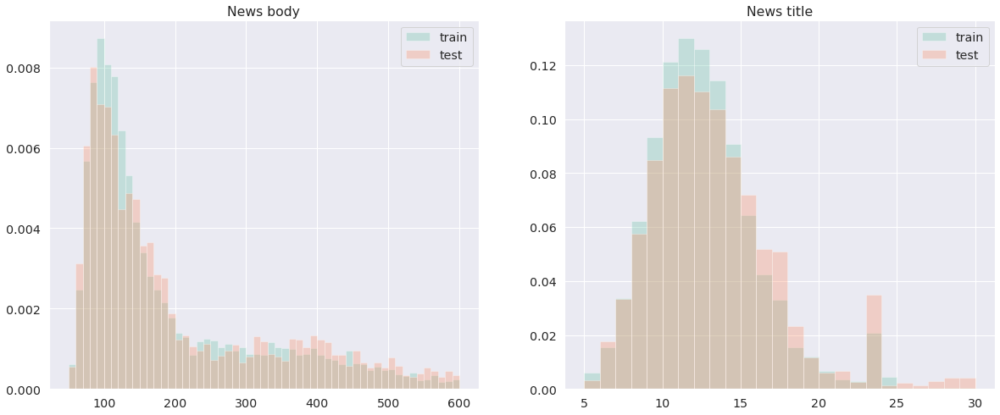

In [43]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
plt.hist(len_train['body'], alpha=0.3, label='train', range=(50, 600), density=True, bins=55)
plt.hist(len_test['body'], alpha=0.3, label='test', range=(50, 600), density=True, bins=55)
plt.legend()
plt.title('News body')

plt.subplot(1, 2, 2)
plt.hist(len_train['title'], alpha=0.3, label='train', range=(5, 30), density=True, bins=25)
plt.hist(len_test['title'], alpha=0.3, label='test', range=(5, 30), density=True, bins=25)
plt.legend()
plt.title('News title')

plt.show()

In [44]:
MAX_LEN = 222
MAX_TITLE_LEN = 22

In [45]:
def get_wordnet_pos(word):
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": nltk.corpus.wordnet.ADJ,
                "N": nltk.corpus.wordnet.NOUN,
                "V": nltk.corpus.wordnet.VERB,
                "R": nltk.corpus.wordnet.ADV}

    return tag_dict.get(tag, nltk.corpus.wordnet.NOUN)

In [46]:
lemmatizer = nltk.stem.WordNetLemmatizer()

pbar_news = tqdm(total=len(news_train)+len(news_test))
def lemmatization(tockens):
    pbar_news.update(1)

    title = tockens['title']
    title = ['<bos>'] + [lemmatizer.lemmatize(w, get_wordnet_pos(w)) for w in title[:min(MAX_TITLE_LEN, len(title))]] + ['<eos>']

    body = tockens['body']
    body = ['<bos>'] + [lemmatizer.lemmatize(w, get_wordnet_pos(w)) for w in body[:min(MAX_LEN, len(body))]] + ['<eos>']

    return pd.Series({'title': title, 'body': body})

news_train = news_train.apply(lemmatization, axis=1)
news_test = news_test.apply(lemmatization, axis=1)
pbar_news.close()

news_train.head()

  0%|          | 0/19405 [00:00<?, ?it/s]

,title,body
date,,
2018-02-01 03:34:00+00:00,"[<bos>, Bitcoin, 's, Big, Wipeout, Erased, $, ...","[<bos>, ©, Bloomberg, ., A, bitcoin, logo, sit..."
2018-02-01 10:30:00+00:00,"[<bos>, India, to, Curb, Cryptocurrency, Use, ...","[<bos>, ©, Reuters, ., India, to, Curb, Crypto..."
2018-02-01 10:53:00+00:00,"[<bos>, Bitcoin, Price, below, $, 10,000, afte...","[<bos>, ©, Reuters, ., Bitcoin, price, below, ..."
2018-02-01 11:08:00+00:00,"[<bos>, Top, 5, Things, to, Know, in, the, Mar...","[<bos>, ©, Reuters, ., 5, key, factor, for, th..."
2018-02-01 12:50:00+00:00,"[<bos>, India, vow, to, eliminate, use, of, cr...","[<bos>, ©, Reuters, ., FILE, PHOTO, :, A, coll..."


In [47]:
len_train = news_train.applymap(len)
len_test = news_test.applymap(len)

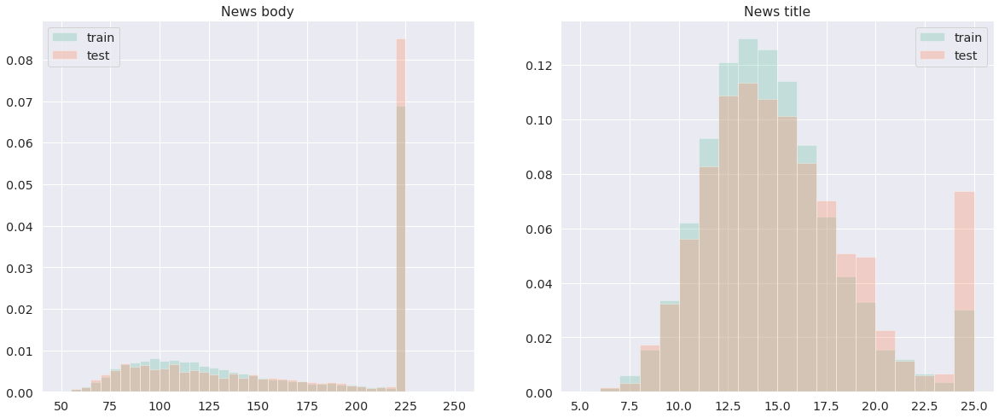

In [48]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
plt.hist(len_train['body'], alpha=0.3, label='train', range=(50, 250), density=True, bins=40)
plt.hist(len_test['body'], alpha=0.3, label='test', range=(50, 250), density=True, bins=40)
plt.legend()
plt.title('News body')

plt.subplot(1, 2, 2)
plt.hist(len_train['title'], alpha=0.3, label='train', range=(5, 25), density=True, bins=20)
plt.hist(len_test['title'], alpha=0.3, label='test', range=(5, 25), density=True, bins=20)
plt.legend()
plt.title('News title')

plt.show()

In [49]:
# news_train.reset_index().to_feather(NEWS_DIR + 'news_train.feather')
# news_test.reset_index().to_feather(NEWS_DIR + 'news_test.feather')
news_train.reset_index().to_feather(NEWS_DIR + 'news_train2.feather') # bigger test
news_test.reset_index().to_feather(NEWS_DIR + 'news_test2.feather')   # bigger test

In [50]:
MAX_LEN = 224
MAX_TITLE_LEN = 24

# news_train = pd.read_feather(NEWS_DIR + 'news_train.feather').set_index('date')
# news_test = pd.read_feather(NEWS_DIR + 'news_test.feather').set_index('date')
news_train = pd.read_feather(NEWS_DIR + 'news_train2.feather').set_index('date') # bigger test
news_test = pd.read_feather(NEWS_DIR + 'news_test2.feather').set_index('date')   # bigger test

In [51]:
news_test.tail()

,title,body
date,,
2022-03-18 16:30:00+00:00,"[<bos>, Coinbase, Adds, Support, for, Solana, ...","[<bos>, ©, Reuters, ., Coinbase, Adds, Support..."
2022-03-18 17:40:00+00:00,"[<bos>, Stranded, no, more, ?, Bitcoin, miner,...","[<bos>, ©, Reuters, ., The, energy, usage, and..."
2022-03-18 18:20:00+00:00,"[<bos>, Price, analysis, 3/18, :, BTC, ,, ETH,...","[<bos>, Bitcoin, (, BTC, ), be, face, a, chall..."
2022-03-18 19:20:00+00:00,"[<bos>, Paxful, partner, with, Miami, mayor, t...","[<bos>, ©, Reuters, Digital, payment, platform..."
2022-03-18 19:30:00+00:00,"[<bos>, Become, the, Whale, in, One, Click, <e...","[<bos>, ©, Reuters, ., Become, the, Whale, in,..."


## Обучение

### Зададим вспомогательные классы и функции

In [19]:
import torch
from torch import nn
import torchtext
from IPython import display
from torchtext.data import get_tokenizer
from torch.utils.data import DataLoader, Dataset
from torchinfo import summary
import torch.nn.functional as F
from sklearn.metrics import mean_absolute_error
from collections import defaultdict
import time
import os

os.environ["WANDB_SILENT"] = "true"
import wandb
import logging

logger = logging.getLogger("wandb")
logger.setLevel(logging.ERROR)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [21]:
with open('wandb_token') as f:
    wandb.login(key=f.read())

In [22]:
SEED = 1234
# зафиксируем SEED для воспроизводимости результатов
torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

In [52]:
vocab = torchtext.vocab.build_vocab_from_iterator(news_train['body'], specials=['<pad>', '<unk>', '<bos>', '<eos>'], min_freq=15)
vocab.set_default_index(vocab['<unk>'])
len(vocab)

7018

In [53]:
class IndicatorsNewsDataset(Dataset):
    def __init__(self, X, y, shifts=4*12, *, news=None, vocab=None):
        self.y = y.astype(np.float32)
        self.X = X.astype(np.float32)
        
        if isinstance(shifts, int):
            self.shifts = np.arange(shifts)
        else:
            self.shifts = np.array(shifts)
            self.shifts.sort()
        self.shifts = self.shifts[::-1]
        self.shift = self.shifts.max()
        
        self.news, self.len_news = pd.DataFrame(), pd.DataFrame()
        self.titles, self.len_titles = pd.DataFrame(), pd.DataFrame()
        self.bos = 2
        self.eos = 3
        self.default_news = [self.bos, self.eos] + [0] * (MAX_LEN - 2)
        self.default_title = [self.bos, self.eos] + [0] * (MAX_TITLE_LEN - 2)
        
        if news is not None and vocab is not None:
            self.bos = vocab['<bos>']
            self.eos = vocab['<eos>']

            self.len_news = pd.Series(
                [len(text) for text in news['body']],
                index=news.index
            )
            self.news = pd.Series(
                [vocab(text.tolist()) + [0] * (MAX_LEN - len(text)) for text in news['body']], 
                index=news.index
            )
            
            self.len_titles = pd.Series(
                [len(title) for title in news['title']], 
                index=news.index
            )
            self.titles = pd.Series(
                [vocab(title.tolist()) + [0] * (MAX_TITLE_LEN - len(title)) for title in news['title']], 
                index=news.index
            )

    def __len__(self):
        return self.X.shape[0] - self.shift

    def __getitem__(self, index):
        begin_news = self.X.index[index - 1] if index > 0 else self.news.index[0]
        end_news = self.X.index[index]
        index_news = (begin_news < self.news.index) & (self.news.index <= end_news)

        if index_news.sum() != 0:
            return np.array(self.X.iloc[index + self.shift - self.shifts]), \
                  np.array(self.y.iloc[index + self.shift]), \
                  np.array(self.news[index_news].tolist()), np.array(self.len_news[index_news]), \
                  np.array(self.titles[index_news].tolist()), np.array(self.len_titles[index_news])
        else:
            return np.array(self.X.iloc[index + self.shift - self.shifts]), \
                  np.array(self.y.iloc[index + self.shift]), \
                  np.array([self.default_news]), np.array([2]), \
                  np.array([self.default_title]), np.array([2])


def collate_fn(batch):
    X_batch, y_batch, news, len_news, titles, len_titles = list(zip(*batch))

    return torch.tensor(np.array(X_batch)), torch.tensor(np.array(y_batch)), \
           news, len_news, titles, len_titles

In [54]:
BATCH_SIZE = 256
shifts=np.arange(2*12) * 2

train_dataset = IndicatorsNewsDataset(X_train_scaled, y_train, shifts=shifts, news=news_train, vocab=vocab)
test_dataset = IndicatorsNewsDataset(X_test_scaled, y_test, shifts=shifts, news=news_test, vocab=vocab)

train_dataloader = DataLoader(train_dataset, 
                              batch_size=BATCH_SIZE, 
                              shuffle=True,
                              collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, 
                             batch_size=BATCH_SIZE, 
                             shuffle=False,
                             collate_fn=collate_fn)

buy_and_hold = X_test['open'].iloc[-len(test_dataset)-1:]
buy_and_hold = (buy_and_hold / buy_and_hold.iloc[0] - 1)[1:]
input_size = X_train_scaled.shape[-1]

In [55]:
def save_state(model, optimizer, epoch, history, name, log_wandb=False):
    torch.save({
        'epoch': epoch + 1,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'history': dict(history),
    }, MODELS_DIR + name + '.data')

    artifact = wandb.Artifact(name, type='model')
    artifact.add_file(MODELS_DIR + name + '.data')
    wandb.log_artifact(artifact)


def load_state(model, optimizer, name):
    load_data = torch.load(MODELS_DIR + name + '.data', map_location=torch.device(device))

    epoch = load_data['epoch'] - 1

    history = defaultdict(lambda: defaultdict(list))
    for k, v in load_data['history'].items():
        for k2, v2 in v.items():
            history[k][k2] = v2

    model.load_state_dict(load_data['model_state_dict'])
    optimizer.load_state_dict(load_data['optimizer_state_dict'])
    
    return model, optimizer, epoch, history


def plot_history(history, start=0, save_name=None):
    num_plots = len(history)
    nrows = int(np.ceil(num_plots / 2))
    
    plt.figure(figsize=(20, 7 * nrows))

    for i, (name, metric) in enumerate(history.items()):
        plt.subplot(nrows, 2, i + 1)

        grid = np.arange(start, len(metric['train']))
        plt.plot(grid, metric['train'][start:], label='train')
        plt.plot(grid, metric['val'][start:], label='val')

        plt.title(name)
        plt.ylabel(name)
        plt.xlabel('Эпоха')
        plt.legend()
        
    if save_name is not None:
        plt.savefig(PLOTS_DIR + save_name)
    plt.show()


class ProfitPercent:
    def __init__(self, fee=FEE, buy_and_hold=None, threshold=None, short=True, long=True):
        self.fee = fee
        self.threshold = threshold
        if threshold is None:
            self.threshold = 2 * self.fee
        self.profit = 0
        
        self.history_preds = []
        self.buy_and_hold = buy_and_hold

        self.current_idx = 0

        self.short = short
        self.long = long

    def update_state(self, y_true, y_pred):
        y_true = torch.squeeze(y_true) / COEF
        y_pred = torch.squeeze(y_pred) / COEF
        y_pred_copy = y_pred.clone()

        idxs = ((y_pred > 2 * self.threshold) & self.long) | ((y_pred < -2 * self.threshold) & self.short)
        y_true = y_true[idxs]
        y_pred = y_pred[idxs]

        fee_sold = (1 + y_true) * (1 - self.fee) * self.fee
        profit = y_true * torch.sign(y_pred) * (1 - self.fee) - fee_sold
        
        y_pred_copy[~idxs] = 0
        y_pred_copy[idxs] = profit
        self.history_preds.extend(y_pred_copy.detach().cpu().tolist())
        
        profit = profit.detach().cpu()
        self.profit += profit.numpy().sum()

    def result(self):
        return self.profit

    def plot(self, create_figure=False):
        profit = np.array(self.history_preds).cumsum()
        grid = np.arange(len(profit))

        if create_figure:
            plt.figure(figsize=(12, 8))
        
        plt.plot(grid, profit, label='Предсказания')
        if self.buy_and_hold is not None:
            plt.plot(grid, self.buy_and_hold, label='Купить и держать')

        plt.legend()
        plt.xlabel('Номер сделки')
        plt.ylabel('Кумулятивная доходность')
        add = ''
        if not self.short and self.long:
            add = ' only long'
        if not self.long and self.short:
            add = ' only short'

        plt.title(f'Комиссия {self.fee * 100}%, Граница {self.threshold * 100}%{add}')


def train(
    model, 
    criterion, 
    optimizer, 
    train_dataloader, 
    val_dataloader,
    scheduler=None,
    start_epoch=0,
    num_epochs=50, 
    history=None,
    save_name=None,
    threshold=0.0005,
    step_plotting=1,
    model_params=None,
):
    best_profits = defaultdict(lambda: -float('inf'))

    if history is None:
        history = defaultdict(lambda: defaultdict(list))
        best_loss = float('inf')
        best_mae = float('inf')
    else:
        best_loss = min(history['loss']['val'])
        best_mae = min(history['mae']['val'])
        for name, value in history.items():
            if name.startswith('profit_'):
                best_profits[name.strip('profit_')] = value['val']

    draw_start=0
        
    profit_dir = PLOTS_DIR + save_name + '_profit'
    os.makedirs(profit_dir, exist_ok=True)

    wandb.init(
        project='Indicators', 
        # We pass a run name (otherwise it’ll be randomly assigned, like sunshine-lollypop-10)
        name=save_name,
        entity="investment-portfolio-optimization",
        # Track hyperparameters and run metadata
        config={
            'num_epochs': num_epochs,
            'loss': type(criterion).__name__,
            'optimizer': type(optimizer).__name__,
            'threshold': threshold,
            'batch_size': train_dataloader.batch_size,
            'shifts': shifts,
            'model_params': model_params,
        }
    )
    wandb.watch(model, criterion=criterion, log='all', log_graph=True, log_freq=512)
    
    for epoch in range(start_epoch, start_epoch + num_epochs):
        train_loss, val_loss = 0.0, 0.0
        train_mae, val_mae = 0.0, 0.0

        profits = {
            'train': {
                'simple': ProfitPercent(fee=0.0),
                'ths': ProfitPercent(fee=0.0, threshold=threshold),
                'fee': ProfitPercent(fee=FEE),
                'fee_ths': ProfitPercent(fee=FEE, threshold=2 * FEE + threshold),
            },
            'val': {
                'simple': ProfitPercent(fee=0.0, buy_and_hold=buy_and_hold),
                'ths': ProfitPercent(fee=0.0, buy_and_hold=buy_and_hold, threshold=threshold),
                'fee': ProfitPercent(fee=FEE, buy_and_hold=buy_and_hold),
                'fee_ths': ProfitPercent(fee=FEE, buy_and_hold=buy_and_hold, threshold=2 * FEE + threshold),
            }
        }

        # Тренируем:
        start_time = time.time()
        model.train()
        
        for X_batch, y_batch, news, len_news, titles, len_titles in tqdm(train_dataloader):
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)

            pred_ret = model(X_batch, news, len_news, titles, len_titles)

            loss = criterion(pred_ret, y_batch)

            optimizer.zero_grad()
            loss.backward()

            optimizer.step()

            train_loss += loss.detach().cpu().numpy()
            mae = mean_absolute_error(y_batch.detach().cpu().numpy(), pred_ret.detach().cpu().numpy())
            train_mae += mae

            for profit in profits['train'].values():
                profit.update_state(y_batch, pred_ret)

            wandb.log({"train_batch/loss": loss.item(), "train_batch/mae": mae})
            wandb.log({f'train_batch/profit_{k}': p.result() for k, p in profits['train'].items()})

            del loss, pred_ret
            del X_batch, y_batch, news, len_news, titles, len_titles
            
        if scheduler is not None:
            scheduler.step()
            
        train_loss /= len(train_dataloader)
        train_mae /= len(train_dataloader)
        
        history['loss']['train'].append(train_loss)
        history['mae']['train'].append(train_mae)

        for key, profit in profits['train'].items():
            history[f'profit_{key}']['train'].append(profit.result())
        
        wandb.log({"train/loss": train_loss, "train/mae": train_mae})
        wandb.log({f'train/profit_{k}': p.result() for k, p in profits['train'].items()})
        
        # Валидируем:
        model.eval()
        with torch.no_grad():
            for X_batch, y_batch, news, len_news, titles, len_titles in tqdm(val_dataloader):
                X_batch = X_batch.to(device)
                y_batch = y_batch.to(device)

                pred_ret = model(X_batch, news, len_news, titles, len_titles)

                loss = criterion(pred_ret, y_batch)
                
                val_loss += loss.detach().cpu().numpy()
                mae = mean_absolute_error(y_batch.detach().cpu().numpy(), pred_ret.detach().cpu().numpy())
                val_mae += mae

                for profit in profits['val'].values():
                    profit.update_state(y_batch, pred_ret)

                wandb.log({"val_batch/loss": loss.item(), "val_batch/mae": mae})
                wandb.log({f'val_batch/profit_{k}': p.result() for k, p in profits['val'].items()})

                del loss, pred_ret
                del X_batch, y_batch, news, len_news, titles, len_titles

        val_loss /= len(val_dataloader)
        val_mae /= len(val_dataloader)
        
        history['loss']['val'].append(val_loss)
        history['mae']['val'].append(val_mae)

        for key, profit in profits['val'].items():
            history[f'profit_{key}']['val'].append(profit.result())
        
        wandb.log({"val/loss": val_loss, "val/mae": val_mae})
        wandb.log({f'val/profit_{k}': p.result() for k, p in profits['val'].items()})
        
        save_state(model, optimizer, epoch, history, save_name + '_last', log_wandb=False)

        if best_loss > val_loss:
            best_loss = val_loss
            save_state(model, optimizer, epoch, history, save_name + '_loss', log_wandb=True)

        if best_mae > val_mae:
            best_mae = val_mae
            save_state(model, optimizer, epoch, history, save_name + '_mae', log_wandb=True)

        for name, profit in profits['val'].items():
            if best_profits[name] < profit.result():
                best_profits[name] = profit.result()
                save_state(model, optimizer, epoch, history, save_name + f'_profit_{name}', log_wandb=True)
        
        # Выводим метрики и строим графики
        if epoch % step_plotting == step_plotting - 1 or epoch == num_epochs - 1:
            display.clear_output()
            
            print(f'Epoch {epoch + 1} of {start_epoch + num_epochs} took {time.time() - start_time:.3f}s')
            
            print(f'  training loss: \t{train_loss:.6f}')
            print(f'  training mae: \t{train_mae:.6f}')

            for name, profit in profits['train'].items():
                print(f'  training profit {name}: \t{profit.result() * 100:.3f} %')

            print(f'  val loss: \t{val_loss:.6f} \t({best_loss:.6f})')
            print(f'  val mae: \t{val_mae:.6f} \t({best_mae:.6f})')
            for name, profit in profits['val'].items():
                print(f'  val profit {name}: \t{profit.result() * 100:.3f} % \t({best_profits[name] * 100:.3f} %)')
            
            if len(history['loss']['train']) > 10:
                delta_begin = history['loss']['train'][draw_start] - history['loss']['train'][draw_start+5]
                delta_end = history['loss']['train'][-6] - history['loss']['train'][-1]
                if delta_begin / delta_end > 10:
                    draw_start = min(draw_start + 5, len(history['loss']['train']) - 2)
            
            plot_history(history, start=draw_start, save_name=f'{save_name}_metris.png')

            for i, (name, profit) in enumerate(profits['val'].items()):
                fig = plt.figure(figsize=(10, 6))
                profit.plot()
                wandb.log({f'profit_plots/{name}': fig})

            plt.figure(figsize=(20, 14))
            for i, (name, profit) in enumerate(profits['val'].items()):
                plt.subplot(2, 2, i + 1)
                profit.plot()
            plt.savefig(profit_dir + f'/{epoch + 1}epoch.png')
            plt.show()
    wandb.finish()

    return model, history

In [56]:
def predict(
    model, 
    criterion,
    val_dataloader,
    threshold=0.0005,
    short=True, long=True,
):    
    val_loss = 0.0
    val_mae = 0.0

    val_profit = ProfitPercent(fee=0.0, buy_and_hold=buy_and_hold, short=short, long=long)
    val_profit_threshold = ProfitPercent(fee=0.0, buy_and_hold=buy_and_hold, threshold=threshold, short=short, long=long)

    val_profit_fee = ProfitPercent(fee=FEE, buy_and_hold=buy_and_hold, short=short, long=long)
    val_profit_fee_threshold = ProfitPercent(fee=FEE, buy_and_hold=buy_and_hold, threshold=2 * FEE + threshold, short=short, long=long)

    model.eval()

    with torch.no_grad():
        for X_batch, y_batch, news, len_news, titles, len_titles in tqdm(val_dataloader):
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)

            pred_ret = model(X_batch, news, len_news, titles, len_titles)

            loss = criterion(pred_ret, y_batch)
            
            val_loss += loss.detach().cpu().numpy()
            val_mae += mean_absolute_error(y_batch.detach().cpu().numpy(), pred_ret.detach().cpu().numpy())
            val_profit.update_state(y_batch, pred_ret)
            val_profit_threshold.update_state(y_batch, pred_ret)
            val_profit_fee.update_state(y_batch, pred_ret)
            val_profit_fee_threshold.update_state(y_batch, pred_ret)

            del loss, pred_ret
            del X_batch, y_batch, news, len_news, titles, len_titles

    val_loss /= len(val_dataloader)
    val_mae /= len(val_dataloader)
    
    # Выводим метрики и строим графики
    display.clear_output()

    print(f'  val loss: \t{val_loss:.6f}')
    print(f'  val mae: \t{val_mae:.6f}')
    print(f'  val profit: \t{val_profit.result() * 100:.3f} %')
    print(f'  val profit ths: \t{val_profit_threshold.result() * 100:.3f} %')
    print(f'  val profit fee: \t{val_profit_fee.result() * 100:.3f} %')
    print(f'  val profit fee ths: \t{val_profit_fee_threshold.result() * 100:.3f} %')
    
    # plot_history(history, save_name=f'{save_name}_metris.png')

    plt.figure(figsize=(20, 14))

    plt.subplot(2, 2, 1)
    val_profit.plot()
    plt.subplot(2, 2, 2)
    val_profit_fee.plot()

    plt.subplot(2, 2, 3)
    val_profit_threshold.plot()
    plt.subplot(2, 2, 4)
    val_profit_fee_threshold.plot()

    # plt.savefig(profit_dir + f'/{epoch + 1}epoch.png')
    plt.show()

    return model

### Обучаем модели

In [ ]:
class ModelSimple(nn.Module):
    def __init__(self, input_size, hidden_size=128, fc_size=32, num_layers=2, dropout=0.5):
        super(ModelSimple, self).__init__()

        self.lstm = nn.LSTM(
            input_size=input_size, 
            hidden_size=hidden_size, 
            num_layers=num_layers, 
            dropout=dropout,
            batch_first=True,
        )
        
        self.fc1 = nn.Linear(hidden_size, fc_size)
        self.norm = nn.BatchNorm1d(fc_size)
        self.dropout = nn.Dropout(dropout)

        self.fc2 = nn.Linear(fc_size, 1)

    def forward(self, X, news=None, len_news=None, titles=None, len_titles=None):
        # X.shape = (BATCH_SIZE, WINDOW_SIZE, N_FEATURES)
        
        out, (hidden, _) = self.lstm(X)
        # out.shape = (BATCH_SIZE, WINDOW_SIZE, HIDDEN_SIZE)
        # hidden.shape = (N_LAYERS, BATCH_SIZE, HIDDEN_SIZE)
        
        output = self.fc1(hidden[-1])
#         output = self.norm(output)
        output = F.relu(self.dropout(output))
        output = self.fc2(output)

        return output

summary(ModelSimple(input_size=input_size, dropout=0.3), (256, 48, input_size))

Layer (type:depth-idx)                   Output Shape              Param #
ModelSimple                              --                        --
├─LSTM: 1-1                              [256, 48, 128]            412,672
├─Linear: 1-2                            [256, 32]                 4,128
├─BatchNorm1d: 1-3                       --                        64
├─Dropout: 1-4                           [256, 32]                 --
├─Linear: 1-5                            [256, 1]                  33
Total params: 416,897
Trainable params: 416,897
Non-trainable params: 0
Total mult-adds (G): 5.07
Input size (MB): 20.55
Forward/backward pass size (MB): 12.65
Params size (MB): 1.67
Estimated Total Size (MB): 34.86

Epoch 25 of 25 took 302.435s
  training loss: 	0.219979
  training mae: 	0.272943
  training profit: 	8643.542 %
  training profit ths: 	5209.118 %
  training profit fee: 	1971.812 %
  training profit fee ths: 	3383.600 %
  val loss: 	0.143504 	(0.129338)
  val mae: 	0.255677 	(0.246583)
  val profit: 	554.807 % 	(594.656 %)
  val profit ths: 	231.907 % 	(260.121 %)
  val profit fee: 	13.931 % 	(18.957 %)
  val profit fee ths: 	10.935 % 	(13.405 %)


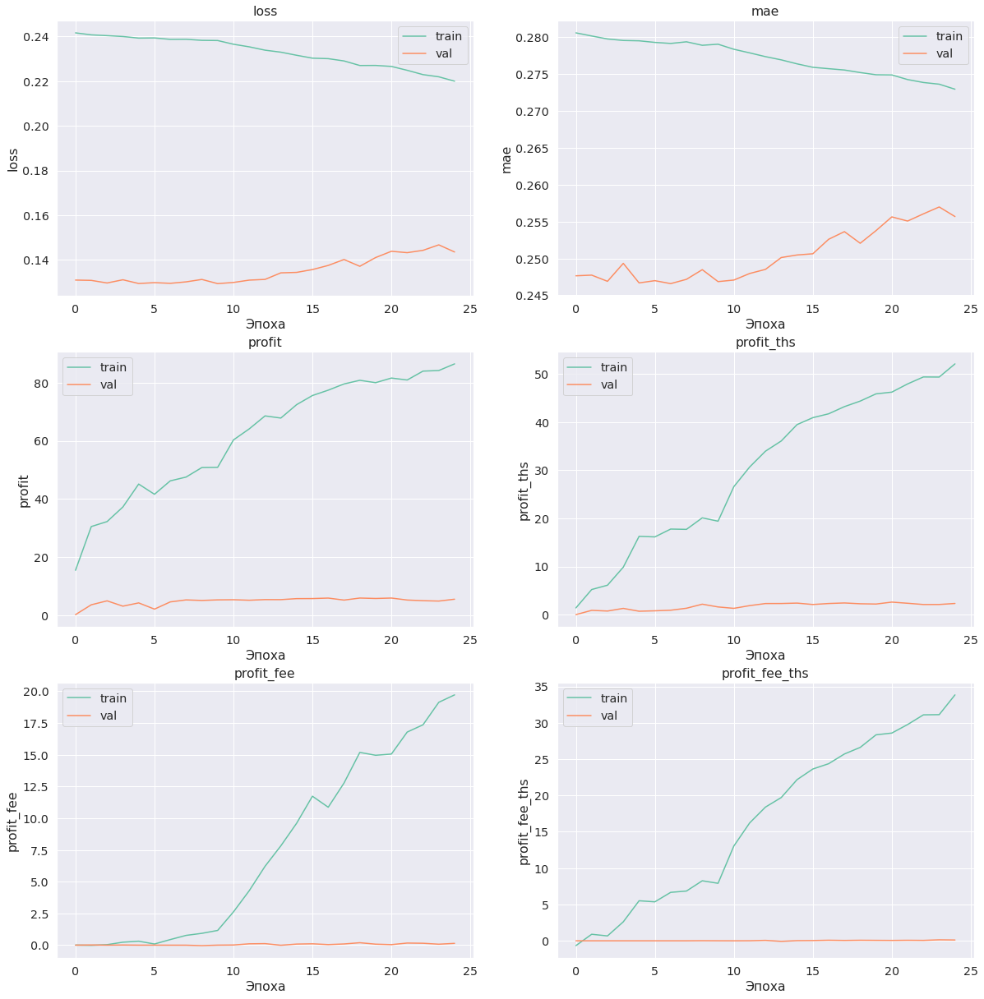

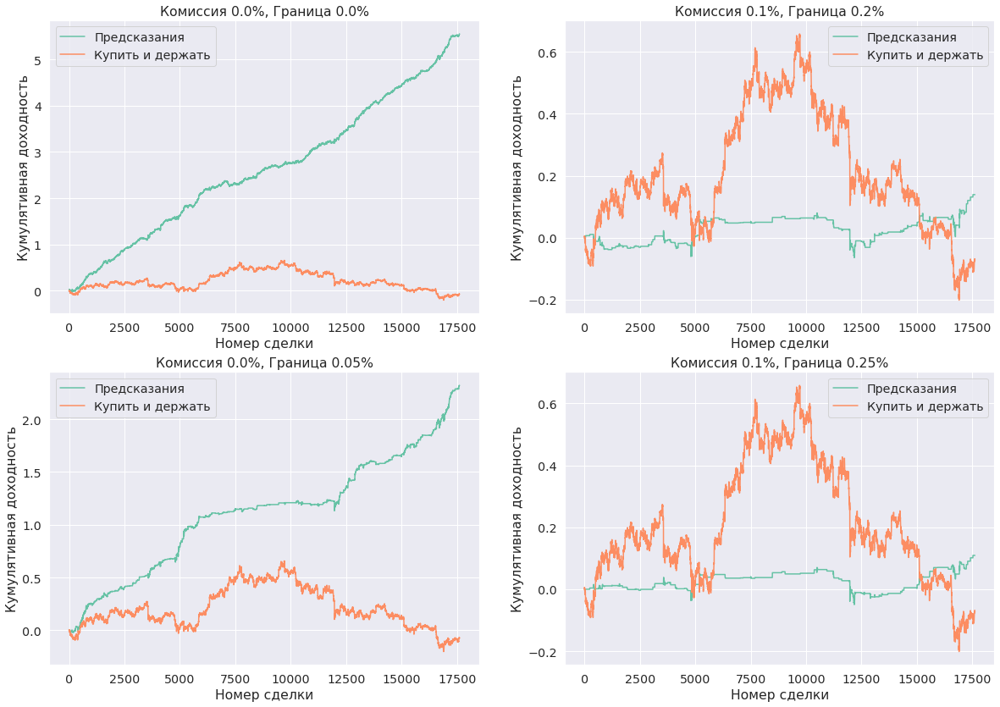

In [ ]:
model_simple = ModelSimple(input_size=input_size, dropout=0.3).to(device)
optimizer = torch.optim.Adam(params=model_simple.parameters(), lr=5e-3)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[10], gamma=0.2)

model_simple, history = train(
    model_simple, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    scheduler=scheduler,
    num_epochs=25,
    save_name='ModelSimple1',
)

Epoch 20 of 25 took 297.434s
  training loss: 	0.198152
  training mae: 	0.267702
  training profit: 	9935.211 %
  training profit ths: 	6717.858 %
  training profit fee: 	3114.470 %
  training profit fee ths: 	4657.665 %
  val loss: 	0.163957 	(0.129338)
  val mae: 	0.265578 	(0.246583)
  val profit: 	546.085 % 	(594.656 %)
  val profit ths: 	232.862 % 	(269.916 %)
  val profit fee: 	6.520 % 	(18.957 %)
  val profit fee ths: 	-2.701 % 	(13.405 %)


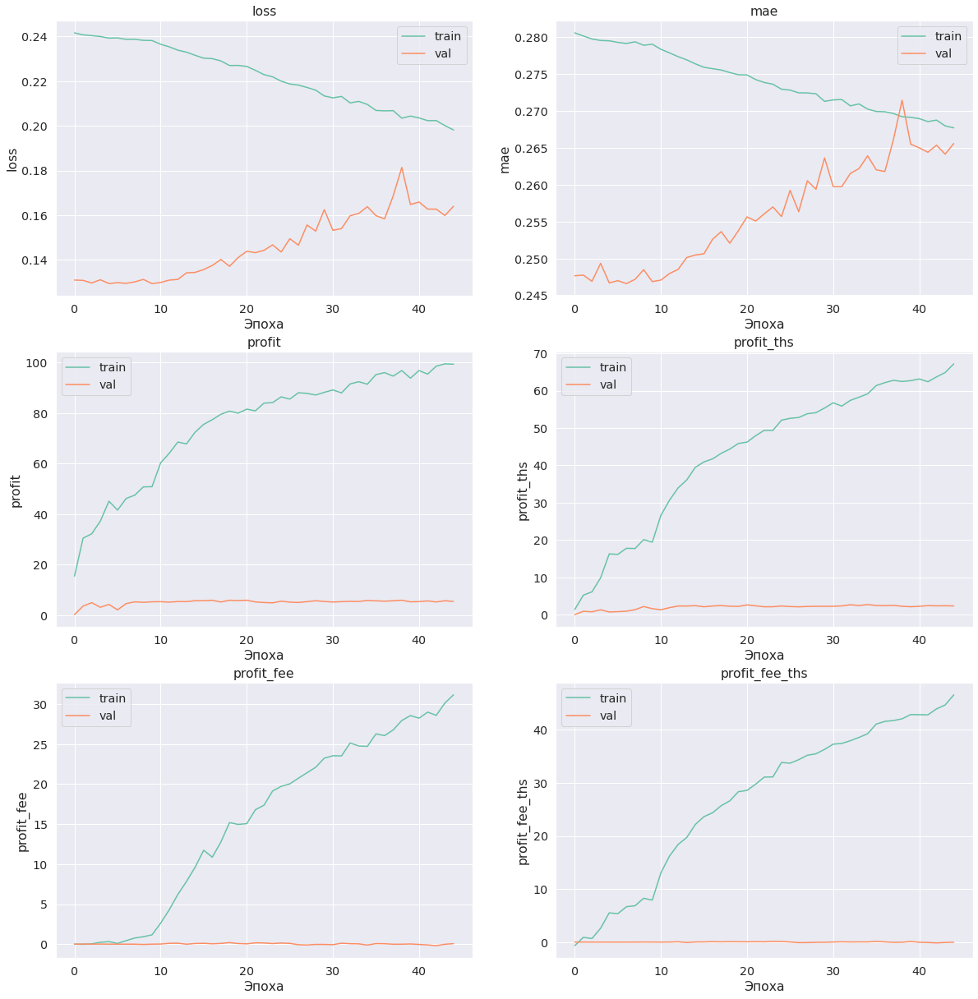

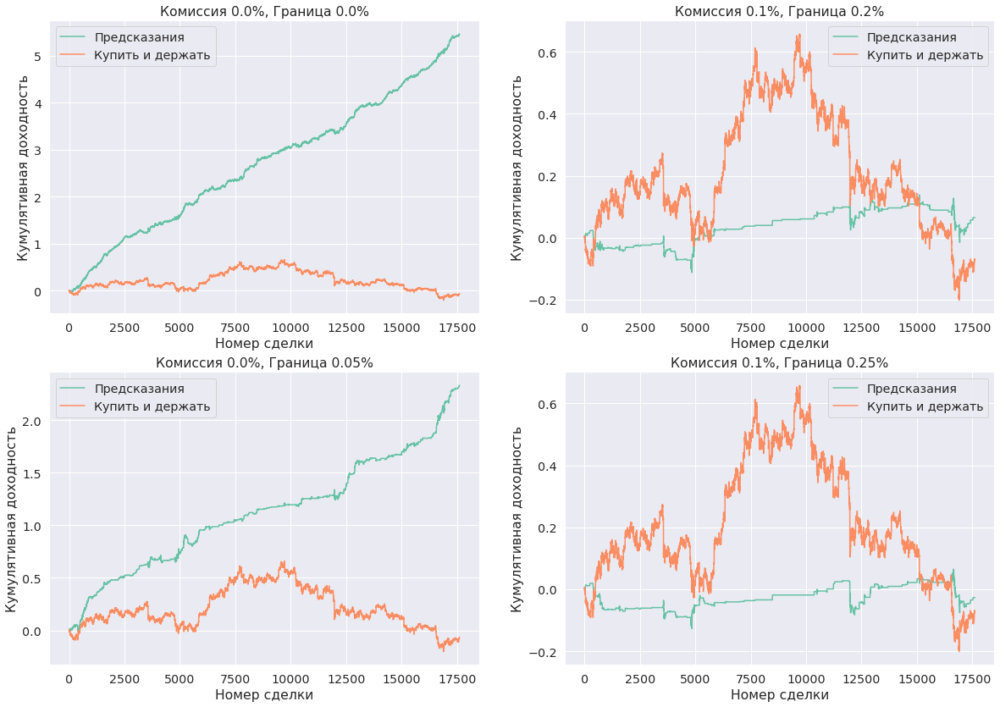

  0%|          | 0/571 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

In [ ]:
model_simple, history = train(
    model_simple, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    history=history,
    scheduler=scheduler,
    num_epochs=25,
    save_name='ModelSimple1',
)

In [ ]:
model_simple = ModelSimple(input_size=input_size, dropout=0.3).to(device)
optimizer = torch.optim.Adam(params=model_simple.parameters(), lr=5e-3)

model_simple, optimizer, epoch, history = load_state(model_simple, optimizer, 'ModelSimple1_profit_ths')

criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[10], gamma=0.2)
start_epoch = len(history['loss']['train'])

In [ ]:
optimizer.param_groups[0]['lr'] = 1e-4

Epoch 45 of 45 took 293.073s
  training loss: 	0.198216
  training mae: 	0.266746
  training profit: 	10310.473 %
  training profit ths: 	6928.890 %
  training profit fee: 	3268.154 %
  training profit fee ths: 	4778.564 %
  val loss: 	0.174230 	(0.129338)
  val mae: 	0.267597 	(0.246583)
  val profit: 	610.093 % 	(610.093 %)
  val profit ths: 	248.198 % 	(269.916 %)
  val profit fee: 	4.200 % 	(18.957 %)
  val profit fee ths: 	3.622 % 	(14.782 %)


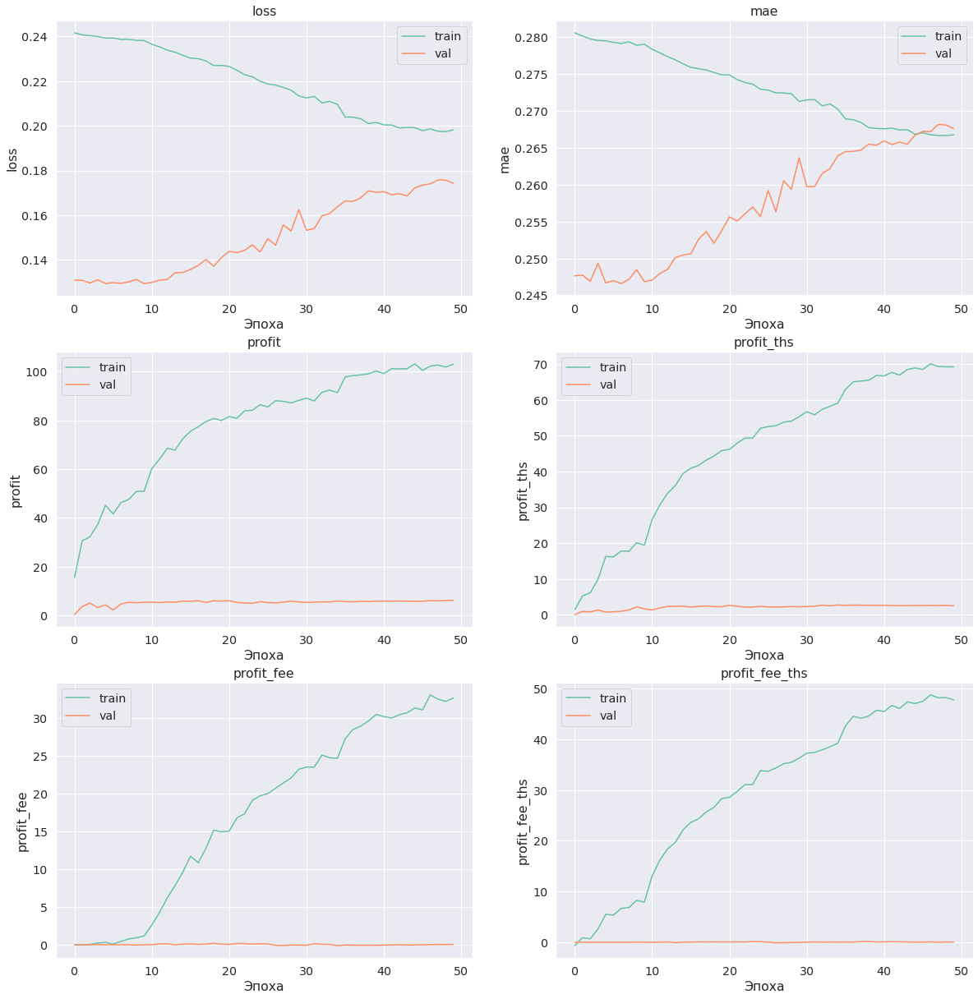

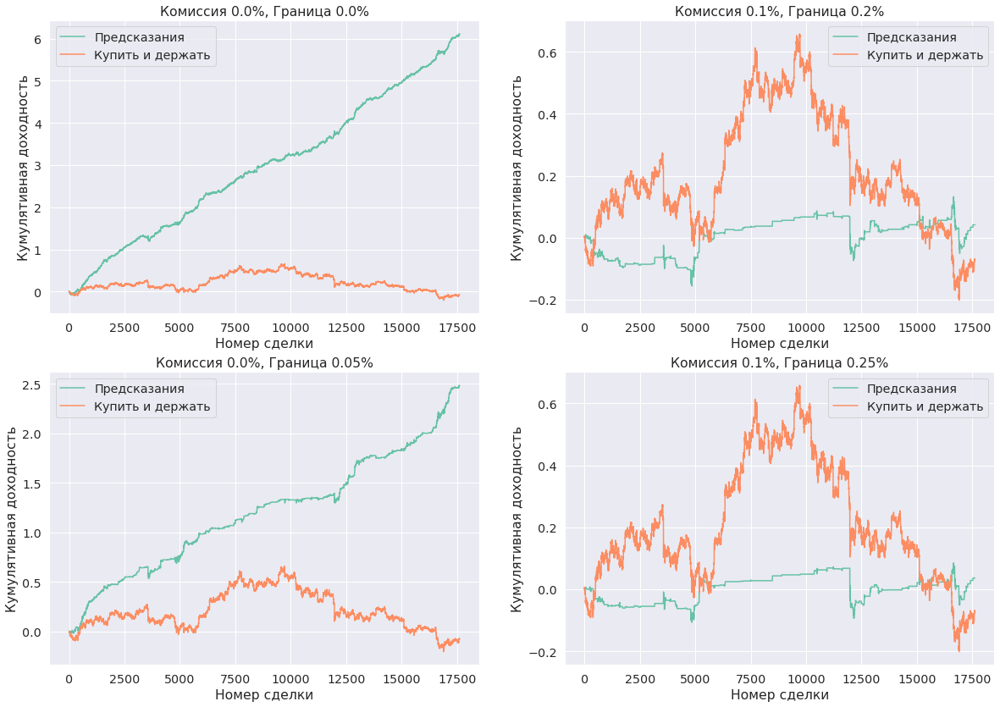

In [ ]:
model_simple, history = train(
    model_simple, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    history=history,
    # scheduler=scheduler,
    num_epochs=10,
    start_epoch=start_epoch,
    save_name='ModelSimple2',
)

Epoch 25 of 25 took 285.864s
  training loss: 	0.185081
  training mae: 	0.260459
  training profit: 	13222.421 %
  training profit ths: 	9527.453 %
  training profit fee: 	4612.125 %
  training profit fee ths: 	6677.020 %
  val loss: 	0.242345 	(0.129829)
  val mae: 	0.309983 	(0.247674)
  val profit: 	476.720 % 	(652.677 %)
  val profit ths: 	299.985 % 	(377.275 %)
  val profit fee: 	-58.202 % 	(15.634 %)
  val profit fee ths: 	-35.147 % 	(22.436 %)


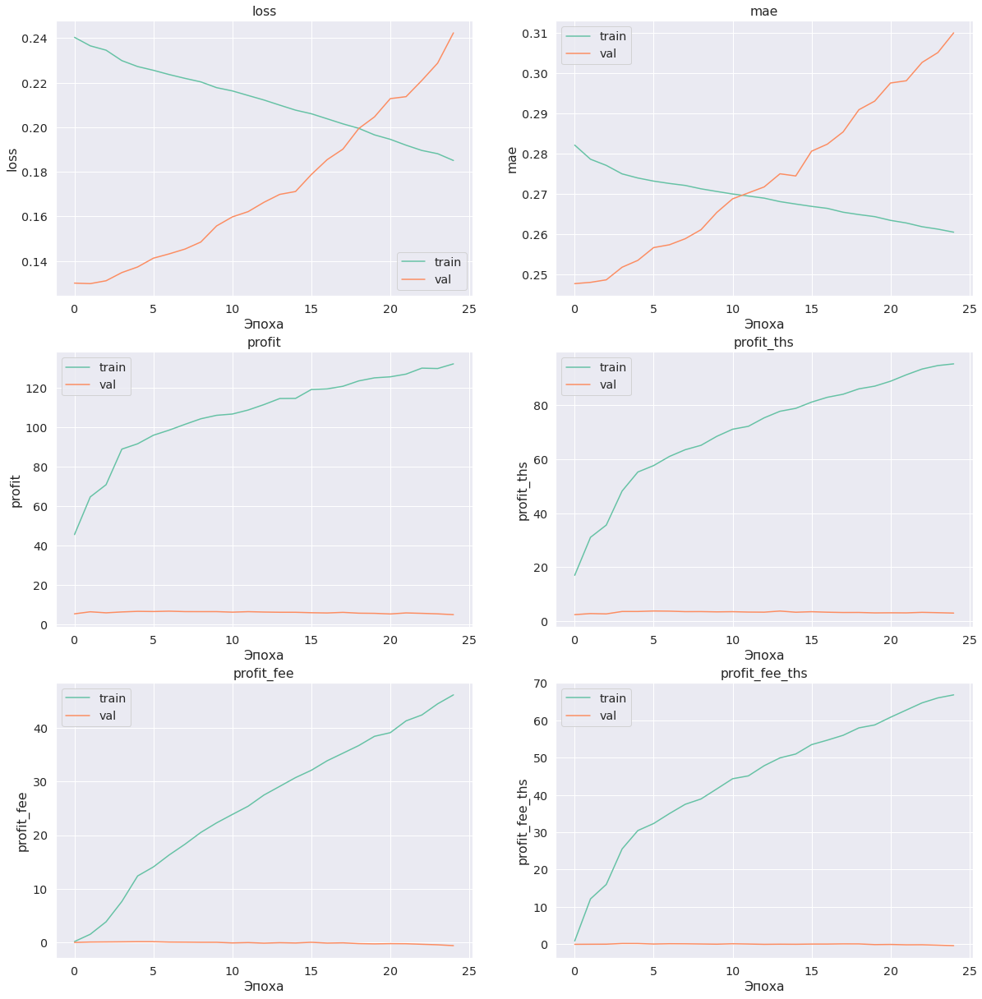

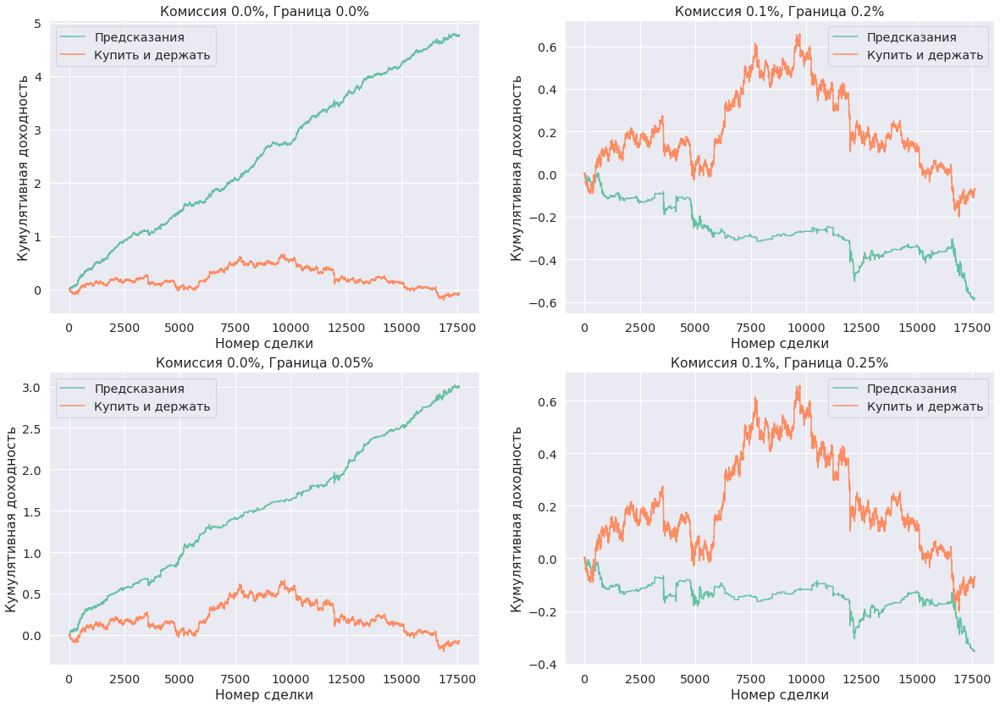

In [ ]:
model_small_simple = ModelSimple(input_size=input_size, num_layers=1, dropout=0.3).to(device)
optimizer = torch.optim.Adam(params=model_small_simple.parameters(), lr=1e-3)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[3], gamma=0.1)

model_small_simple, history = train(
    model_small_simple, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    scheduler=scheduler,
    num_epochs=25,
    save_name='ModelSmallSimple',
)

In [ ]:
class ModelSimpleSmall(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=1, dropout=0.5):
        super(ModelSimpleSmall, self).__init__()

        self.lstm = nn.LSTM(
            input_size=input_size, 
            hidden_size=hidden_size, 
            num_layers=num_layers, 
            dropout=dropout,
            batch_first=True,
        )
        
        self.dropout = nn.Dropout(dropout)
        self.fc1 = nn.Linear(hidden_size, 8)
        self.fc2 = nn.Linear(8, 1)

    def forward(self, X, news=None, len_news=None, titles=None, len_titles=None):
        # X.shape = (BATCH_SIZE, WINDOW_SIZE, N_FEATURES)
        
        out, (hidden, _) = self.lstm(X)
        # out.shape = (BATCH_SIZE, WINDOW_SIZE, HIDDEN_SIZE)
        # hidden.shape = (N_LAYERS, BATCH_SIZE, HIDDEN_SIZE)
        
        output = self.fc1(self.dropout(hidden[-1]))
        # output = self.norm(output)
        output = self.fc2(F.relu(output))
        return output

summary(ModelSimpleSmall(input_size=input_size, dropout=0.3), (256, 48, input_size))

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning:

dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1



Layer (type:depth-idx)                   Output Shape              Param #
ModelSimpleSmall                         --                        --
├─LSTM: 1-1                              [256, 48, 64]             123,904
├─Dropout: 1-2                           [256, 64]                 --
├─Linear: 1-3                            [256, 8]                  520
├─Linear: 1-4                            [256, 1]                  9
Total params: 124,433
Trainable params: 124,433
Non-trainable params: 0
Total mult-adds (G): 1.52
Input size (MB): 20.55
Forward/backward pass size (MB): 6.31
Params size (MB): 0.50
Estimated Total Size (MB): 27.35

Epoch 25 of 25 took 266.324s
  training loss: 	0.219619
  training mae: 	0.271903
  training profit: 	10002.745 %
  training profit ths: 	6567.962 %
  training profit fee: 	2092.443 %
  training profit fee ths: 	3950.909 %
  val loss: 	0.158324 	(0.129112)
  val mae: 	0.267966 	(0.245959)
  val profit: 	540.330 % 	(641.826 %)
  val profit ths: 	305.343 % 	(344.076 %)
  val profit fee: 	-25.564 % 	(40.351 %)
  val profit fee ths: 	-15.299 % 	(40.229 %)


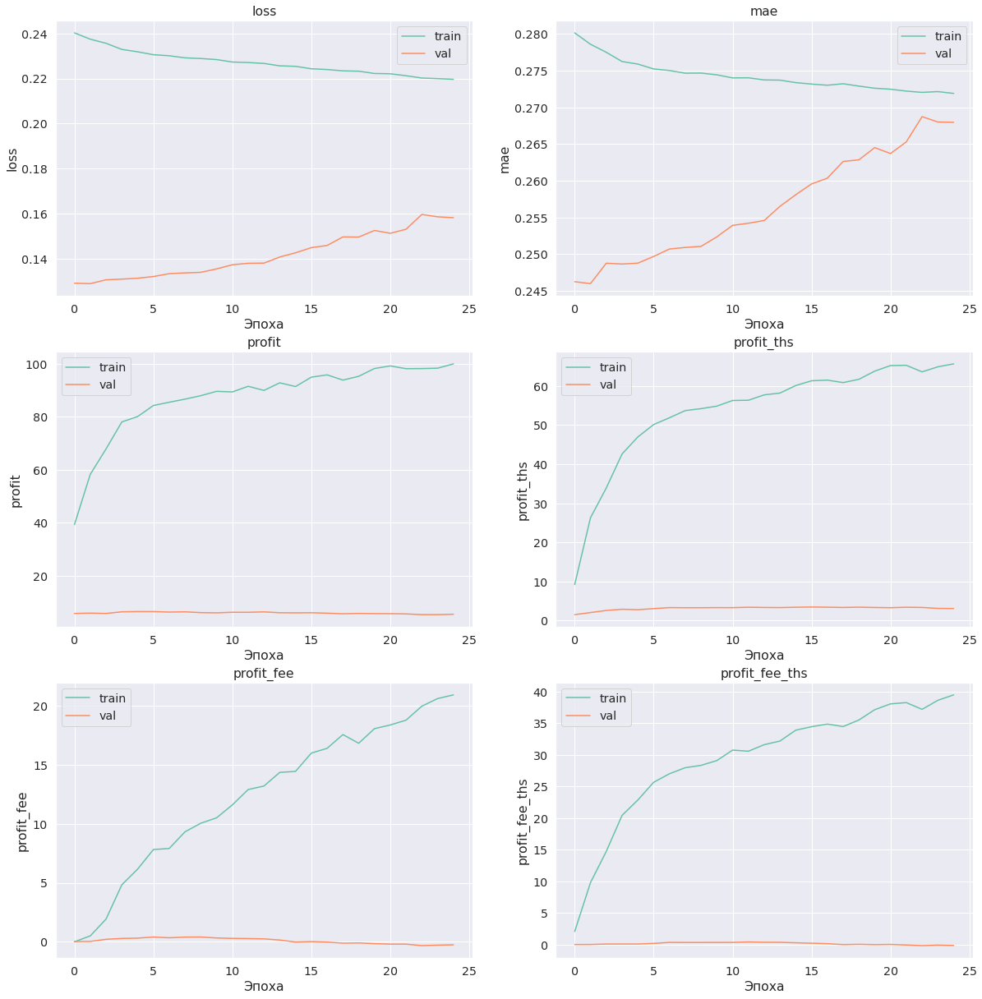

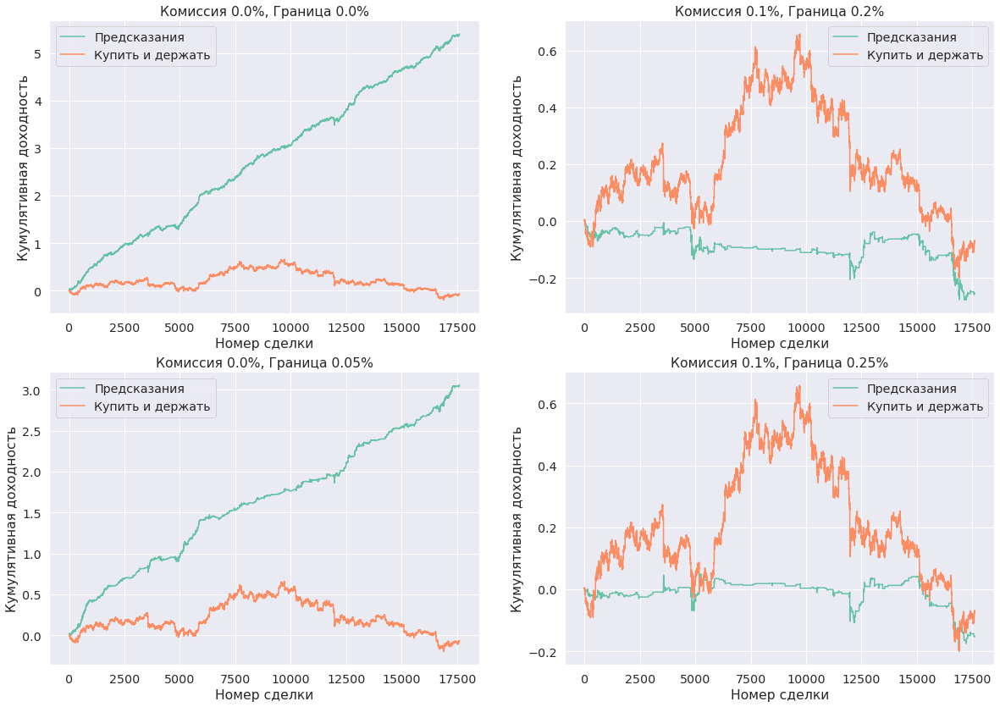

In [ ]:
model_small_simple2 = ModelSimpleSmall(input_size=input_size, hidden_size=64, num_layers=1, dropout=0.3).to(device)
optimizer = torch.optim.Adam(params=model_small_simple2.parameters(), lr=1e-3)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[3], gamma=0.1)

model_small_simple2, history = train(
    model_small_simple2, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    scheduler=scheduler,
    num_epochs=25,
    save_name='ModelSmallSimple2',
)

Epoch 9 of 25 took 275.756s
  training loss: 	0.271139
  training mae: 	0.271139
  training profit: 	7634.656 %
  training profit ths: 	4701.995 %
  training profit fee: 	684.576 %
  training profit fee ths: 	2161.300 %
  val loss: 	0.251628 	(0.245336)
  val mae: 	0.251628 	(0.245336)
  val profit: 	555.159 % 	(555.159 %)
  val profit ths: 	271.027 % 	(273.202 %)
  val profit fee: 	13.552 % 	(24.500 %)
  val profit fee ths: 	17.137 % 	(19.386 %)


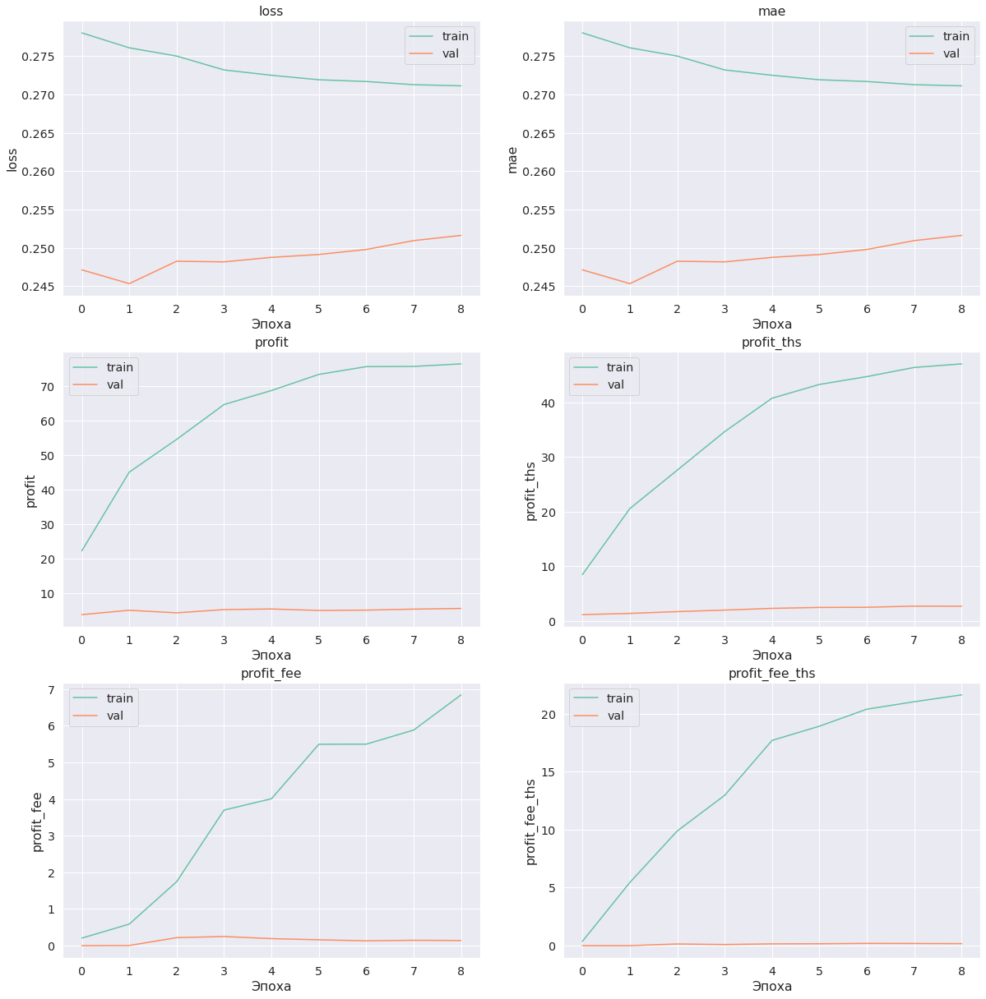

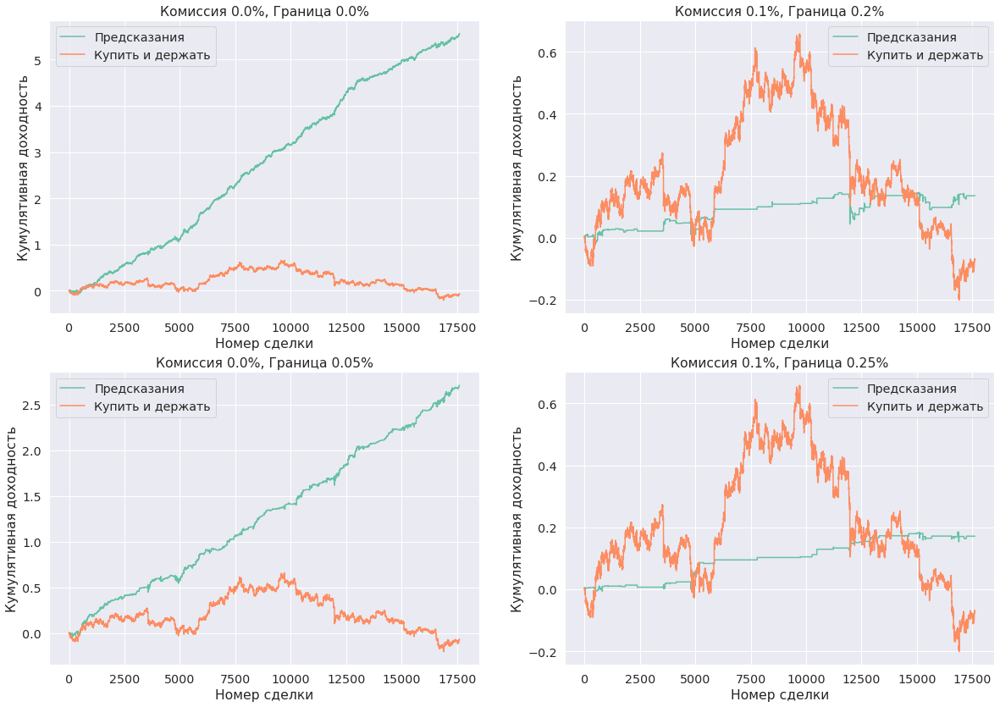

  0%|          | 0/571 [00:00<?, ?it/s]

In [ ]:
model_small_simple3 = ModelSimpleSmall(input_size=input_size, hidden_size=64, num_layers=1, dropout=0.3).to(device)
optimizer = torch.optim.Adam(params=model_small_simple3.parameters(), lr=1e-3)
criterion = nn.L1Loss()
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[3], gamma=0.1)

model_small_simple3, history = train(
    model_small_simple3, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    scheduler=scheduler,
    num_epochs=25,
    save_name='ModelSmallSimple3',
)

In [ ]:
class ModelLSTM_CNN(nn.Module):
    def __init__(self, input_size, hidden_size=128, num_layers=2, dropout=0.5):
        super(ModelLSTM_CNN, self).__init__()

        self.lstm = nn.LSTM(
            input_size=input_size, 
            hidden_size=hidden_size, 
            num_layers=num_layers, 
            dropout=dropout,
            batch_first=True,
        )

        self.conv = nn.Sequential(
            nn.Conv1d(in_channels=input_size, out_channels=128, kernel_size=8),
            nn.BatchNorm1d(128),
            nn.ReLU(),

            nn.Conv1d(in_channels=128, out_channels=256, kernel_size=5),
            nn.BatchNorm1d(256),
            nn.ReLU(),

            nn.Conv1d(in_channels=256, out_channels=128, kernel_size=3),
            nn.BatchNorm1d(128),
            nn.ReLU(),
        )
        
        self.fc1 = nn.Linear(hidden_size + 128, 32)
        self.norm = nn.BatchNorm1d(32)
        self.dropout = nn.Dropout(dropout)

        self.fc2 = nn.Linear(32, 1)

    def forward(self, X, news=None, len_news=None, titles=None, len_titles=None):
        # X.shape = (BATCH_SIZE, WINDOW_SIZE, N_FEATURES)
        
        out, (hidden, _) = self.lstm(X)
        # out.shape = (BATCH_SIZE, WINDOW_SIZE, HIDDEN_SIZE)
        # hidden.shape = (N_LAYERS, BATCH_SIZE, HIDDEN_SIZE)

        X = X.transpose(1, 2)
        # X.shape = (BATCH_SIZE, N_FEATURES, WINDOW_SIZE)
        conv_output = self.conv(X)
        # conv_output.shape = (BATCH_SIZE, 128, ...)

        conv_output = self.dropout(F.adaptive_max_pool1d(conv_output, 1))
        # conv_output.shape = (BATCH_SIZE, 128)

        output = torch.cat((hidden[-1], torch.flatten(conv_output, 1)), dim=1)
        
        output = self.fc1(output)
#         output = self.norm(output)
        output = F.relu(self.dropout(output))
        output = self.fc2(output)

        return output

summary(ModelLSTM_CNN(input_size=418), (256, 48, 418))

Layer (type:depth-idx)                   Output Shape              Param #
ModelLSTM_CNN                            --                        --
├─LSTM: 1-1                              [256, 48, 128]            412,672
├─Sequential: 1-2                        [256, 128, 35]            --
│    └─Conv1d: 2-1                       [256, 128, 41]            428,160
│    └─BatchNorm1d: 2-2                  [256, 128, 41]            256
│    └─ReLU: 2-3                         [256, 128, 41]            --
│    └─Conv1d: 2-4                       [256, 256, 37]            164,096
│    └─BatchNorm1d: 2-5                  [256, 256, 37]            512
│    └─ReLU: 2-6                         [256, 256, 37]            --
│    └─Conv1d: 2-7                       [256, 128, 35]            98,432
│    └─BatchNorm1d: 2-8                  [256, 128, 35]            256
│    └─ReLU: 2-9                         [256, 128, 35]            --
├─Dropout: 1-3                           [256, 128, 1]         

In [ ]:
model_lstm_cnn = ModelLSTM_CNN(input_size=input_size).to(device)
optimizer = torch.optim.Adam(params=model_lstm_cnn.parameters(), lr=1e-3)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[10], gamma=0.1)

model_lstm_cnn, history = train(
    model_lstm_cnn, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    scheduler=scheduler,
    num_epochs=25,
    save_name='Model_LSTM_CNN',
)

  0%|          | 0/143 [00:00<?, ?it/s]

KeyboardInterrupt: 

### Indicators + News

In [28]:
class TextModule(nn.Module):
    def __init__(self, embedding, embedding_size, hidden_size, dropout, max_len):
        super(TextModule, self).__init__()

        self.max_len = max_len

        self.embedding = embedding
        self.lstm = nn.LSTM(
            input_size=embedding_size, 
            hidden_size=hidden_size, 
            num_layers=1, 
            batch_first=True, 
            bidirectional=True,
            dropout=dropout
        )

    def forward(self, text, text_len):
        # text.shape = (BS, MAX_LEN)

        embed = self.embedding(text)
        # embed = (BS, MAX_LEN, EMBED_SIZE)

        packed_in = nn.utils.rnn.pack_padded_sequence(
            embed, text_len, batch_first=True, enforce_sorted=False
        )
        packed_out, (hidden_state, _) = self.lstm(packed_in)
        out, lengths = nn.utils.rnn.pad_packed_sequence(
            packed_out, batch_first=True, total_length=self.max_len
        )
        # out.shape = (BS, MAX_LEN, 2 * HIDDEN_SIZE)
        # hidden_state.shape = (2, BS, HIDDEN_SIZE)

        avg_pool = torch.sum(out, dim=1) / lengths.to(device).view(-1, 1)
        # avg_pool.shape = (BS, 2 * HIDDEN_SIZE)

        max_pool = torch.cat([torch.max(o[:l], dim=0)[0].view(1, -1) for o, l in zip(out, lengths)], dim=0)
        # max_pool.shape = (BS, 2 * HIDDEN_SIZE)

        output = torch.cat([hidden_state[-1], hidden_state[-2], avg_pool, max_pool], dim=1)
        # output.shape = (BS, 6 * HIDDEN_SIZE)
        return output


class ModelSimpleIndNews(nn.Module):
    def __init__(self, input_size, hidden_size=196, fc_size=64, num_layers=1, 
                 dropout=0.5, embedding_size=80, hidden_news_size=32, 
                 hidden_title_size=24, max_news_len=MAX_LEN, max_title_len=MAX_TITLE_LEN):
        super(ModelSimpleIndNews, self).__init__()
        
        self.max_news_len = max_news_len
        self.max_title_len = max_title_len
        self.embedding = nn.Embedding(len(vocab), embedding_size, padding_idx=vocab['<pad>'])

        # INDICATORS
        self.lstm = nn.LSTM(
            input_size=input_size, 
            hidden_size=hidden_size, 
            num_layers=num_layers, 
            dropout=dropout,
            batch_first=True,
        )
        self.norm_ind = nn.BatchNorm1d(hidden_size)

        # NEWS
        self.news_module = TextModule(self.embedding, embedding_size, 
                                      hidden_news_size, dropout, max_len=max_news_len)
        self.norm_news = nn.BatchNorm1d(6 * hidden_news_size)

        # TITLES
        self.title_module = TextModule(self.embedding, embedding_size, 
                                       hidden_title_size, dropout, max_len=max_title_len)
        self.norm_title = nn.BatchNorm1d(6 * hidden_title_size)

        # UNION
        self.fc1 = nn.Linear(hidden_size + 6 * hidden_news_size + 6 * hidden_title_size, fc_size)
        self.norm = nn.BatchNorm1d(fc_size)
        self.dropout = nn.Dropout(dropout)

        self.fc2 = nn.Linear(fc_size, 1)

    def forward(self, X, news, len_news, titles, len_titles):
        # X.shape = (BATCH_SIZE, WINDOW_SIZE, N_FEATURES)
        # news = (BS, [MAX_LEN, ...])
        last_news = torch.tensor(np.array(
            [n[-1] if len(n) > 0 else [0] * self.max_news_len for n in news]
        )).to(device)
        last_len_news = [l[-1] if len(l) > 0 else 0 for l in len_news]

        last_titles = torch.tensor(np.array(
            [t[-1] if len(t) > 0 else [0] * self.max_title_len for t in titles]
        )).to(device)
        last_len_titles = [l[-1] if len(l) > 0 else 0 for l in len_titles]
        
        # INDICATORS
        _, (hidden_ind, _) = self.lstm(X)
        #   out.shape = (BATCH_SIZE, WINDOW_SIZE, HIDDEN_SIZE)
        #   hidden_ind.shape = (N_LAYERS, BATCH_SIZE, HIDDEN_SIZE)
        hidden_ind = self.norm_ind(hidden_ind[-1])
        #   hidden_ind.shape = (BATCH_SIZE, HIDDEN_SIZE)
        
        # NEWS
        news_out = self.news_module(last_news, last_len_news)
        news_out = self.norm_news(news_out)
        #   news_out.shape = (BATCH_SIZE, 6 * HIDDEN_NEWS_SIZE)

        # TITLES
        title_out = self.title_module(last_titles, last_len_titles)
        title_out = self.norm_title(title_out)
        #   title_out.shape = (BATCH_SIZE, 6 * HIDDEN_TITLE_SIZE)

        # UNION
        output = torch.cat([hidden_ind, news_out, title_out], dim=1)
        #   output.shape = (BATCH_SIZE, HIDDEN_SIZE + 6 * HIDDEN_NEWS_SIZE + 6 * HIDDEN_TITLE_SIZE)
        output = self.fc1(output)
        # output = self.norm(output)
        output = F.relu(self.dropout(output))
        output = self.fc2(output)

        return output

# summary(ModelSimple(input_size=input_size, dropout=0.3), (256, 48, input_size))

Epoch 8 of 25 took 275.345s
  training loss: 	0.187909
  training mae: 	0.245463
  training profit simple: 	7035.100 %
  training profit ths: 	4658.751 %
  training profit fee: 	1074.293 %
  training profit fee_ths: 	803.795 %
  val loss: 	0.144381 	(0.131794)
  val mae: 	0.259177 	(0.249689)
  val profit simple: 	458.207 % 	(518.329 %)
  val profit ths: 	285.349 % 	(285.349 %)
  val profit fee: 	35.338 % 	(35.338 %)
  val profit fee_ths: 	18.147 % 	(18.147 %)


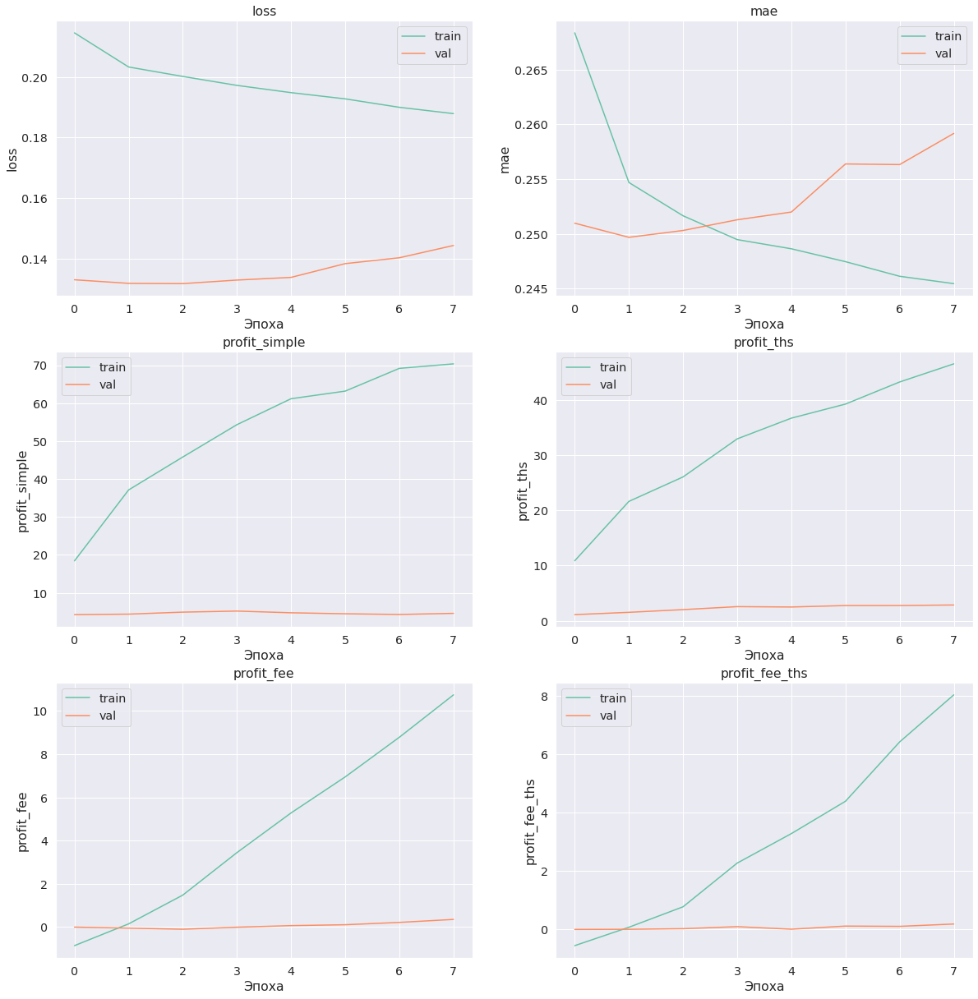

/usr/local/lib/python3.7/dist-packages/plotly/matplotlylib/renderer.py:613: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

/usr/local/lib/python3.7/dist-packages/plotly/matplotlylib/renderer.py:613: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

/usr/local/lib/python3.7/dist-packages/plotly/matplotlylib/renderer.py:613: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

/usr/local/lib/python3.7/dist-packages/plotly/matplotlylib/renderer.py:613: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



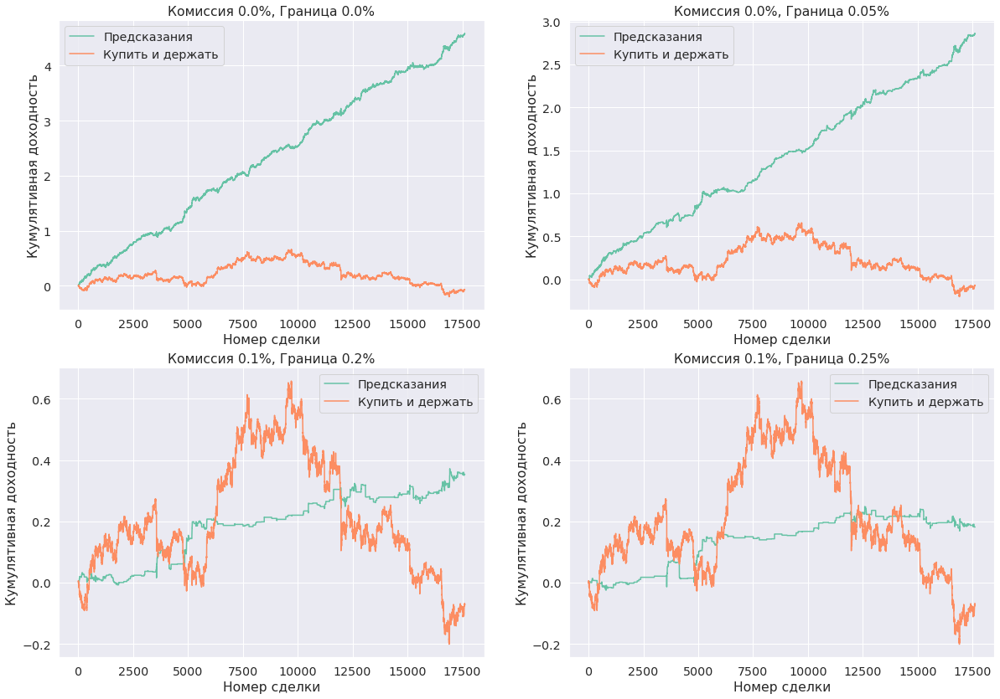

  0%|          | 0/479 [00:00<?, ?it/s]

In [ ]:
model_params = dict(
    input_size=input_size, 
    hidden_size=128, 
    fc_size=48, 
    num_layers=1, 
    dropout=0.3, 
    embedding_size=80, 
    hidden_news_size=32, 
    hidden_title_size=24, 
    max_news_len=MAX_LEN, 
    max_title_len=MAX_TITLE_LEN
)

model_1 = ModelSimpleIndNews(**model_params).to(device)
optimizer = torch.optim.Adam(params=model_1.parameters(), lr=1e-4)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[15], gamma=0.2)

model_1, history = train(
    model_1, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    scheduler=scheduler,
    num_epochs=25,
    save_name='ModelIndNews2',
    model_params=model_params
)

In [31]:
model_params = dict(
    input_size=input_size, 
    hidden_size=64, 
    fc_size=32, 
    num_layers=2, 
    dropout=0.3, 
    embedding_size=80, 
    hidden_news_size=24, 
    hidden_title_size=16, 
    max_news_len=MAX_LEN, 
    max_title_len=MAX_TITLE_LEN
)

Epoch 22 of 25 took 241.757s
  training loss: 	0.178873
  training mae: 	0.242994
  training profit simple: 	7231.018 %
  training profit ths: 	4534.087 %
  training profit fee: 	1533.991 %
  training profit fee_ths: 	1244.416 %
  val loss: 	0.140693 	(0.130206)
  val mae: 	0.257940 	(0.248056)
  val profit simple: 	460.239 % 	(512.554 %)
  val profit ths: 	222.077 % 	(223.385 %)
  val profit fee: 	21.546 % 	(33.797 %)
  val profit fee_ths: 	19.680 % 	(23.139 %)


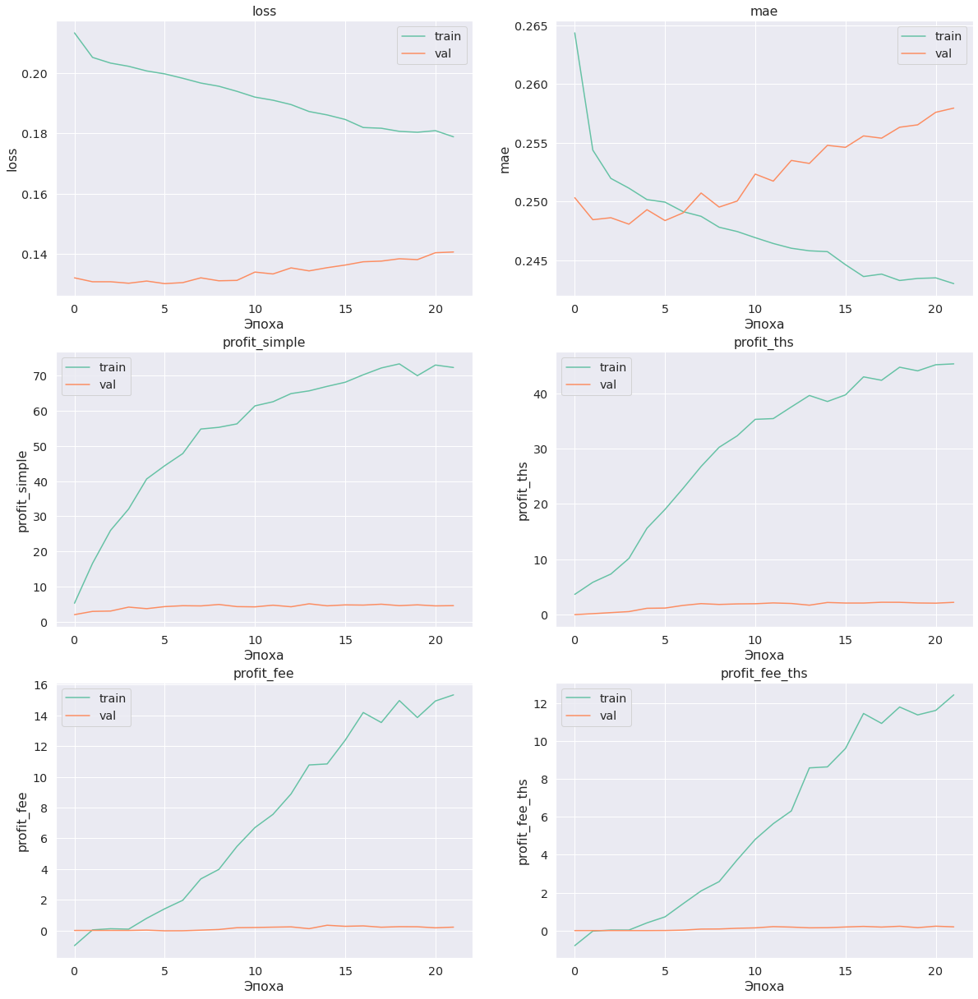

/usr/local/lib/python3.7/dist-packages/plotly/matplotlylib/renderer.py:613: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

/usr/local/lib/python3.7/dist-packages/plotly/matplotlylib/renderer.py:613: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

/usr/local/lib/python3.7/dist-packages/plotly/matplotlylib/renderer.py:613: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

/usr/local/lib/python3.7/dist-packages/plotly/matplotlylib/renderer.py:613: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



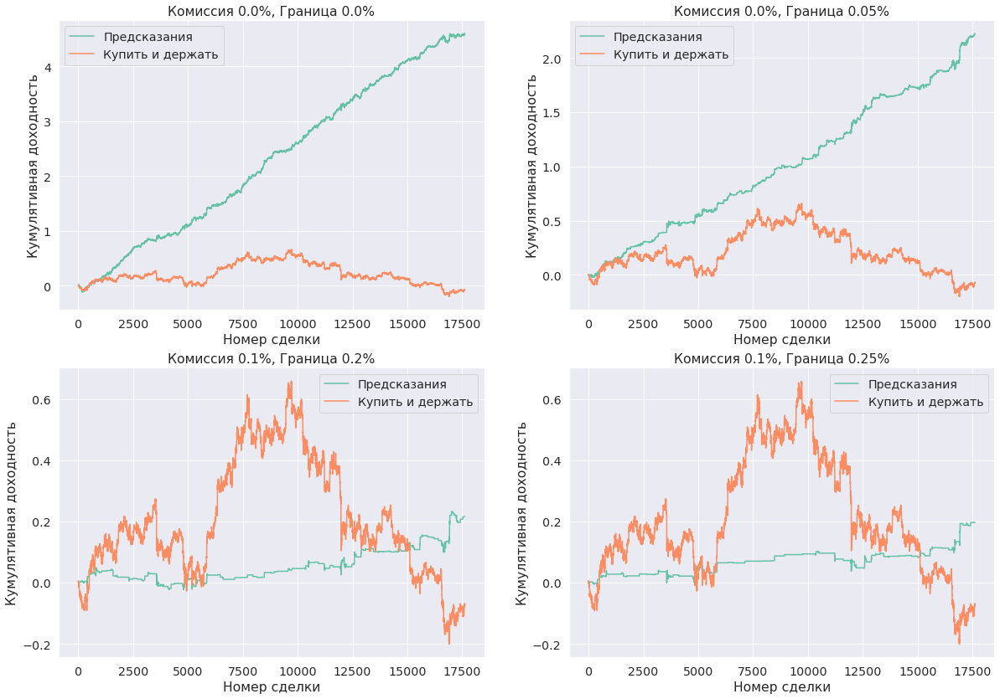

  0%|          | 0/479 [00:00<?, ?it/s]

In [ ]:
model_1 = ModelSimpleIndNews(**model_params).to(device)
optimizer = torch.optim.Adam(params=model_1.parameters(), lr=1e-4)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[15], gamma=0.2)

model_1, history = train(
    model_1, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    scheduler=scheduler,
    num_epochs=25,
    save_name='ModelIndNews3',
    model_params=model_params
)

## Предсказания

### Only Indicators

#### 2021.08.01-2022.01.31

  val loss: 	0.134114
  val mae: 	0.251041
  val profit: 	601.767 %
  val profit ths: 	325.975 %
  val profit fee: 	40.351 %
  val profit fee ths: 	32.316 %


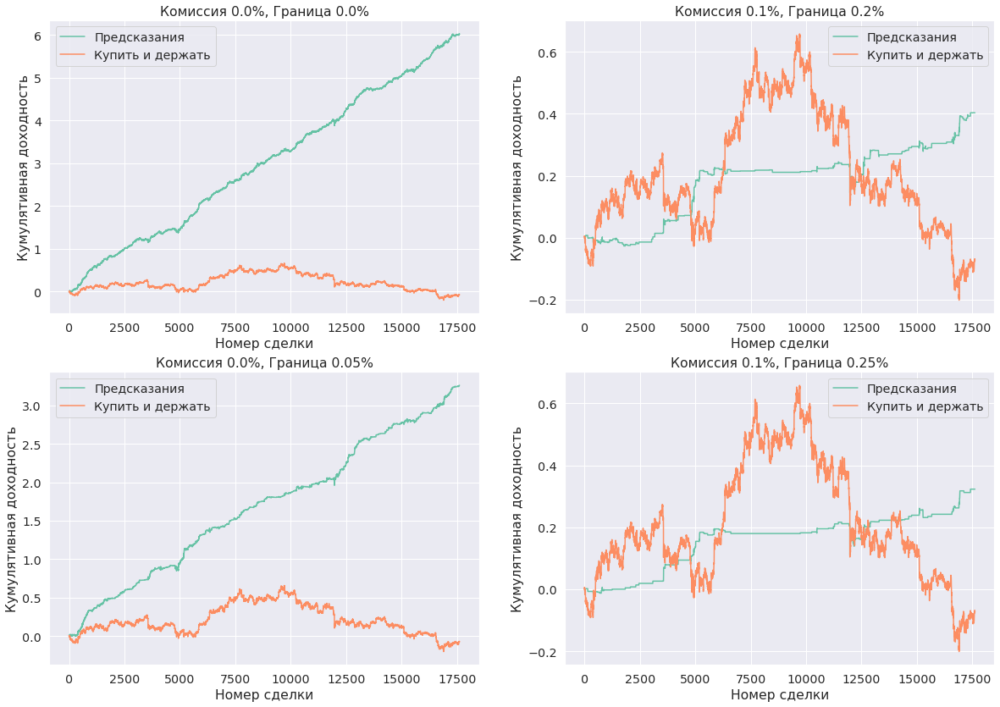

ModelSimpleSmall(
  (lstm): LSTM(418, 64, batch_first=True, dropout=0.3)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc1): Linear(in_features=64, out_features=8, bias=True)
  (fc2): Linear(in_features=8, out_features=1, bias=True)
)

In [ ]:
model_small_simple2 = ModelSimpleSmall(input_size=input_size, hidden_size=64, num_layers=1, dropout=0.3)
optimizer = torch.optim.Adam(params=model_small_simple2.parameters(), lr=1e-3)
criterion = nn.MSELoss()
model_small_simple2, optimizer, epoch, history = load_state(model_small_simple2, optimizer, 'ModelSmallSimple2_profit_fee')

predict(
    model_small_simple2, 
    criterion,
    test_dataloader,
    threshold=0.0005,
    short=True, long=True
)

  val loss: 	0.138122
  val mae: 	0.254199
  val profit: 	613.968 %
  val profit ths: 	338.206 %
  val profit fee: 	27.133 %
  val profit fee ths: 	40.229 %


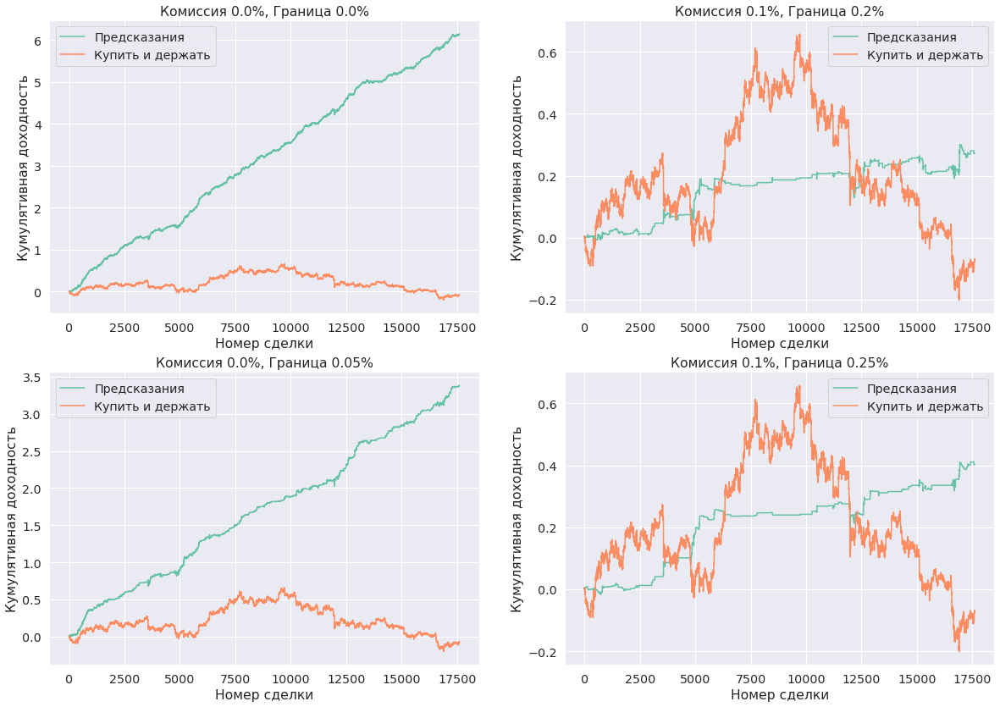

ModelSimpleSmall(
  (lstm): LSTM(418, 64, batch_first=True, dropout=0.3)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc1): Linear(in_features=64, out_features=8, bias=True)
  (fc2): Linear(in_features=8, out_features=1, bias=True)
)

In [ ]:
model_small_simple2 = ModelSimpleSmall(input_size=input_size, hidden_size=64, num_layers=1, dropout=0.3)
optimizer = torch.optim.Adam(params=model_small_simple2.parameters(), lr=1e-3)
criterion = nn.MSELoss()
model_small_simple2, optimizer, epoch, history = load_state(model_small_simple2, optimizer, 'ModelSmallSimple2_profit_fee_ths')

predict(
    model_small_simple2, 
    criterion,
    test_dataloader,
    threshold=0.0005,
    short=True, long=True
)

#### 2021.08.01-2022.03.20

  val loss: 	0.136208
  val mae: 	0.250090
  val profit: 	786.259 %
  val profit ths: 	408.839 %
  val profit fee: 	46.129 %
  val profit fee ths: 	28.256 %


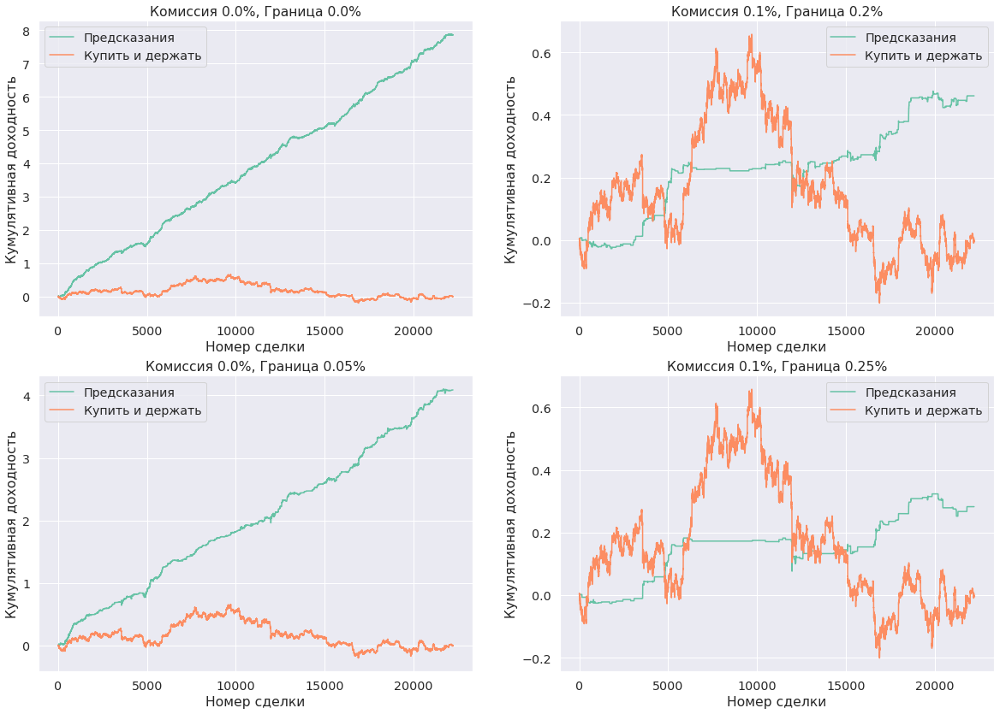

ModelSimpleSmall(
  (lstm): LSTM(418, 64, batch_first=True, dropout=0.3)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc1): Linear(in_features=64, out_features=8, bias=True)
  (fc2): Linear(in_features=8, out_features=1, bias=True)
)

In [ ]:
model_small_simple2 = ModelSimpleSmall(input_size=input_size, hidden_size=64, num_layers=1, dropout=0.3)
optimizer = torch.optim.Adam(params=model_small_simple2.parameters(), lr=1e-3)
criterion = nn.MSELoss()
model_small_simple2, optimizer, epoch, history = load_state(model_small_simple2, optimizer, 'ModelSmallSimple2_profit_fee')

predict(
    model_small_simple2, 
    criterion,
    test_dataloader,
    threshold=0.0005,
    short=True, long=True
)

  val loss: 	0.140146
  val mae: 	0.253237
  val profit: 	762.191 %
  val profit ths: 	415.881 %
  val profit fee: 	40.213 %
  val profit fee ths: 	43.922 %


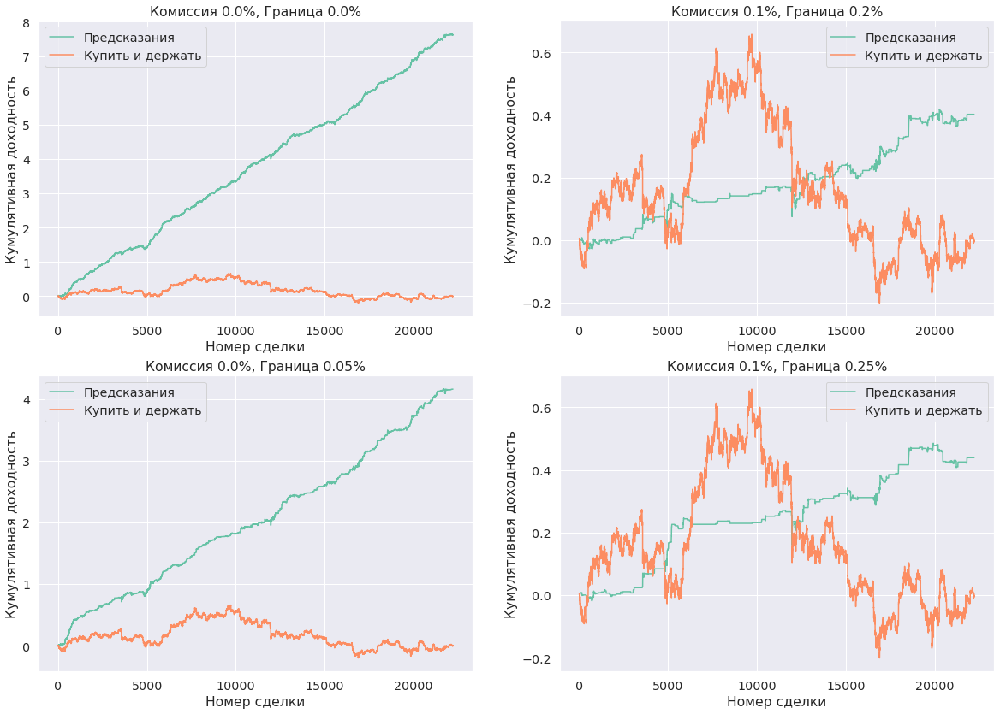

ModelSimpleSmall(
  (lstm): LSTM(418, 64, batch_first=True, dropout=0.3)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc1): Linear(in_features=64, out_features=8, bias=True)
  (fc2): Linear(in_features=8, out_features=1, bias=True)
)

In [ ]:
model_small_simple2 = ModelSimpleSmall(input_size=input_size, hidden_size=64, num_layers=1, dropout=0.3)
optimizer = torch.optim.Adam(params=model_small_simple2.parameters(), lr=1e-3)
criterion = nn.MSELoss()
model_small_simple2, optimizer, epoch, history = load_state(model_small_simple2, optimizer, 'ModelSmallSimple2_profit_fee_ths')

predict(
    model_small_simple2, 
    criterion,
    test_dataloader,
    threshold=0.0005,
    short=True, long=True
)

### Indicators + news

#### 2021.08.01-2022.01.31

  val loss: 	0.140449
  val mae: 	0.257579
  val profit: 	453.819 %
  val profit ths: 	207.166 %
  val profit fee: 	17.055 %
  val profit fee ths: 	23.139 %


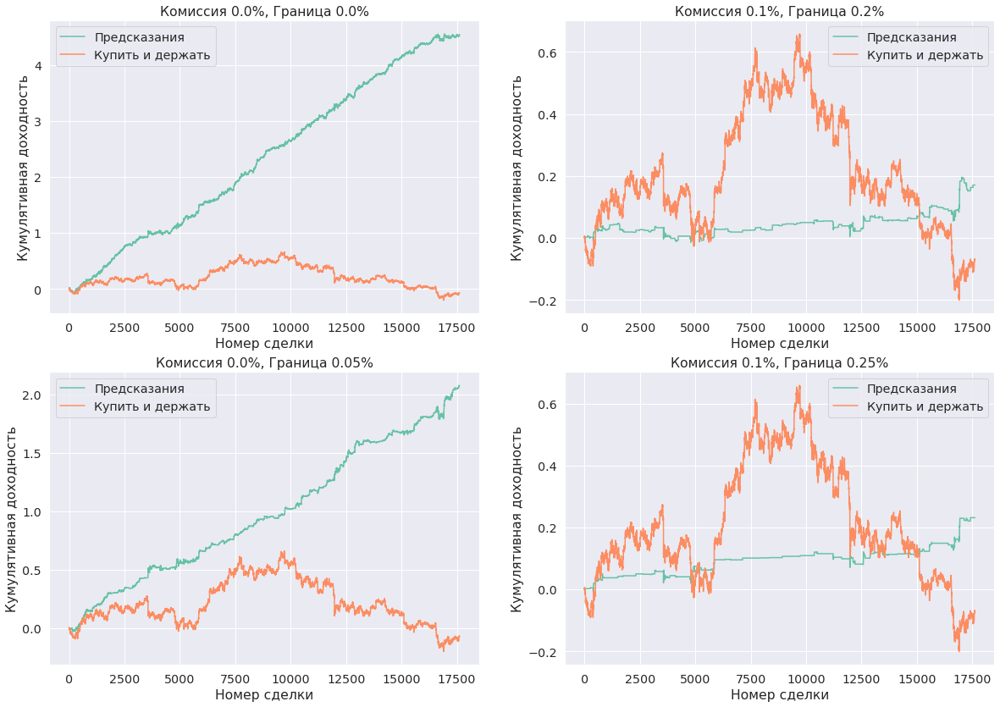

ModelSimpleIndNews(
  (embedding): Embedding(7018, 80, padding_idx=0)
  (lstm): LSTM(370, 64, num_layers=2, batch_first=True, dropout=0.3)
  (norm_ind): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (news_module): TextModule(
    (embedding): Embedding(7018, 80, padding_idx=0)
    (lstm): LSTM(80, 24, batch_first=True, dropout=0.3, bidirectional=True)
  )
  (norm_news): BatchNorm1d(144, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (title_module): TextModule(
    (embedding): Embedding(7018, 80, padding_idx=0)
    (lstm): LSTM(80, 16, batch_first=True, dropout=0.3, bidirectional=True)
  )
  (norm_title): BatchNorm1d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=304, out_features=32, bias=True)
  (norm): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=32, out_features=1, bias=True)

In [32]:
model = ModelSimpleIndNews(**model_params).to(device)
optimizer = torch.optim.Adam(params=model.parameters(), lr=1e-3)
criterion = nn.MSELoss()
model, optimizer, epoch, history = load_state(model, optimizer, 'ModelIndNews3_profit_fee_ths')

predict(
    model, 
    criterion,
    test_dataloader,
    threshold=0.0005,
    short=True, long=True
)

  val loss: 	0.135490
  val mae: 	0.254766
  val profit: 	455.303 %
  val profit ths: 	219.613 %
  val profit fee: 	33.797 %
  val profit fee ths: 	15.298 %


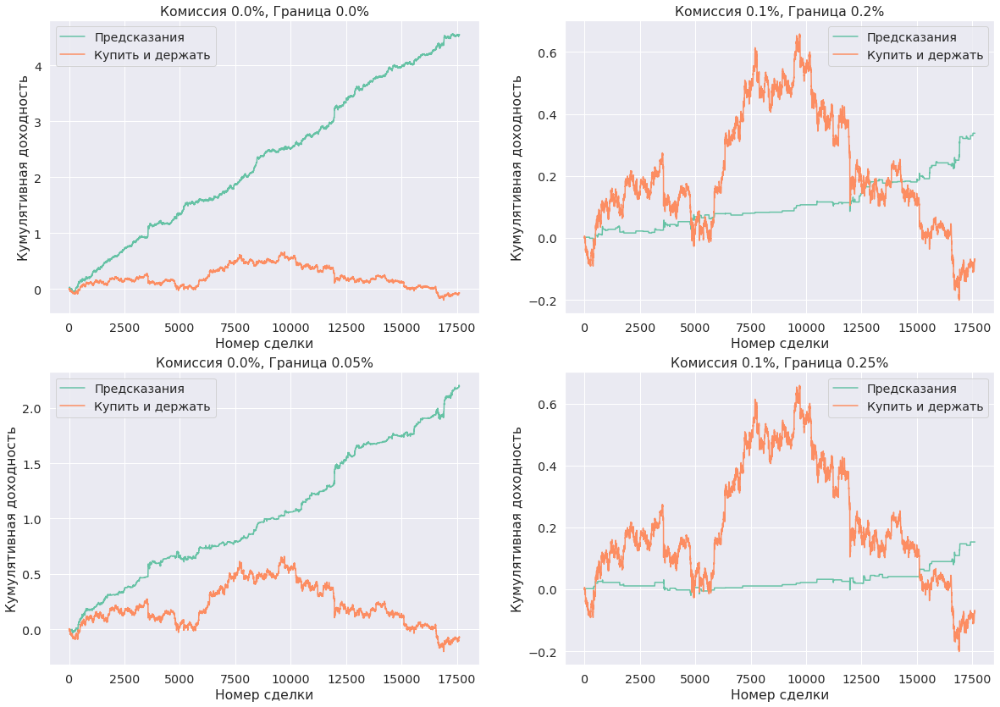

ModelSimpleIndNews(
  (embedding): Embedding(7018, 80, padding_idx=0)
  (lstm): LSTM(370, 64, num_layers=2, batch_first=True, dropout=0.3)
  (norm_ind): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (news_module): TextModule(
    (embedding): Embedding(7018, 80, padding_idx=0)
    (lstm): LSTM(80, 24, batch_first=True, dropout=0.3, bidirectional=True)
  )
  (norm_news): BatchNorm1d(144, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (title_module): TextModule(
    (embedding): Embedding(7018, 80, padding_idx=0)
    (lstm): LSTM(80, 16, batch_first=True, dropout=0.3, bidirectional=True)
  )
  (norm_title): BatchNorm1d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=304, out_features=32, bias=True)
  (norm): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=32, out_features=1, bias=True)

In [33]:
model = ModelSimpleIndNews(**model_params).to(device)
optimizer = torch.optim.Adam(params=model.parameters(), lr=1e-3)
criterion = nn.MSELoss()
model, optimizer, epoch, history = load_state(model, optimizer, 'ModelIndNews3_profit_fee')

predict(
    model, 
    criterion,
    test_dataloader,
    threshold=0.0005,
    short=True, long=True
)

#### 2021.08.01-2022.03.20

  val loss: 	0.141582
  val mae: 	0.256164
  val profit: 	592.111 %
  val profit ths: 	260.107 %
  val profit fee: 	27.296 %
  val profit fee ths: 	33.292 %


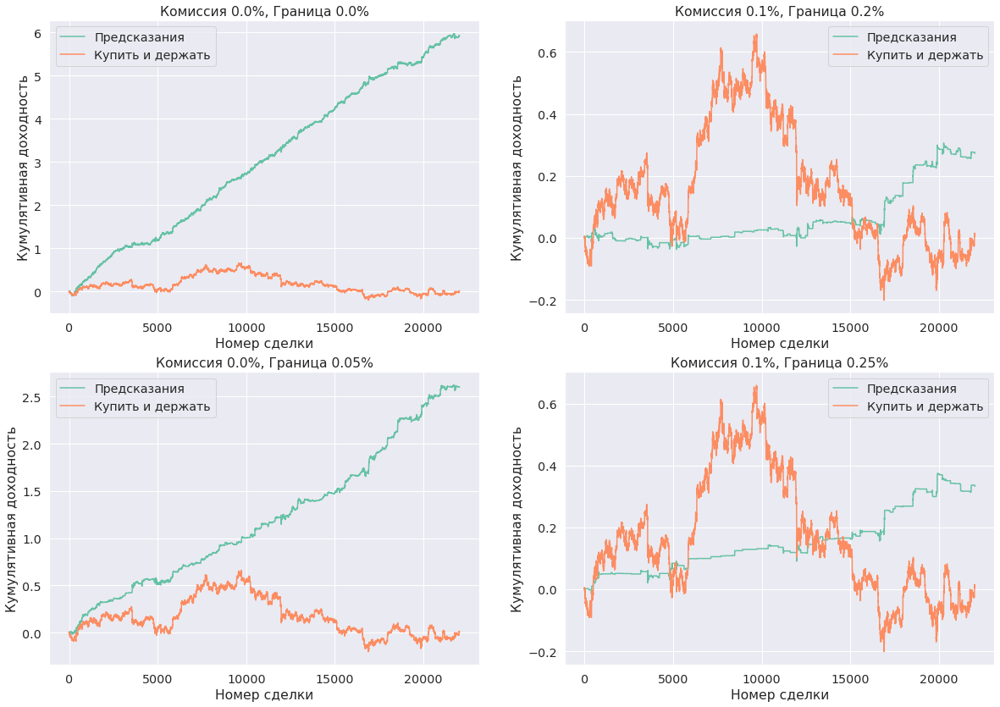

ModelSimpleIndNews(
  (embedding): Embedding(7018, 80, padding_idx=0)
  (lstm): LSTM(370, 64, num_layers=2, batch_first=True, dropout=0.3)
  (norm_ind): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (news_module): TextModule(
    (embedding): Embedding(7018, 80, padding_idx=0)
    (lstm): LSTM(80, 24, batch_first=True, dropout=0.3, bidirectional=True)
  )
  (norm_news): BatchNorm1d(144, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (title_module): TextModule(
    (embedding): Embedding(7018, 80, padding_idx=0)
    (lstm): LSTM(80, 16, batch_first=True, dropout=0.3, bidirectional=True)
  )
  (norm_title): BatchNorm1d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=304, out_features=32, bias=True)
  (norm): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=32, out_features=1, bias=True)

In [57]:
model = ModelSimpleIndNews(**model_params).to(device)
optimizer = torch.optim.Adam(params=model.parameters(), lr=1e-3)
criterion = nn.MSELoss()
model, optimizer, epoch, history = load_state(model, optimizer, 'ModelIndNews3_profit_fee_ths')

predict(
    model, 
    criterion,
    test_dataloader,
    threshold=0.0005,
    short=True, long=True
)

  val loss: 	0.137274
  val mae: 	0.253562
  val profit: 	603.133 %
  val profit ths: 	308.245 %
  val profit fee: 	36.051 %
  val profit fee ths: 	21.240 %


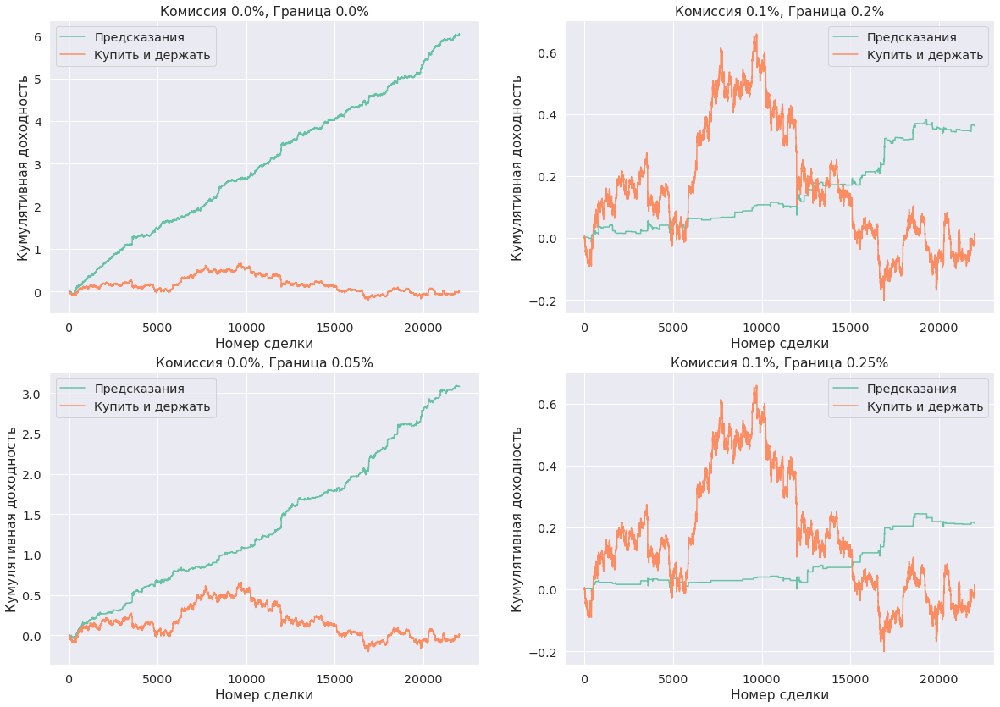

ModelSimpleIndNews(
  (embedding): Embedding(7018, 80, padding_idx=0)
  (lstm): LSTM(370, 64, num_layers=2, batch_first=True, dropout=0.3)
  (norm_ind): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (news_module): TextModule(
    (embedding): Embedding(7018, 80, padding_idx=0)
    (lstm): LSTM(80, 24, batch_first=True, dropout=0.3, bidirectional=True)
  )
  (norm_news): BatchNorm1d(144, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (title_module): TextModule(
    (embedding): Embedding(7018, 80, padding_idx=0)
    (lstm): LSTM(80, 16, batch_first=True, dropout=0.3, bidirectional=True)
  )
  (norm_title): BatchNorm1d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=304, out_features=32, bias=True)
  (norm): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc2): Linear(in_features=32, out_features=1, bias=True)

In [58]:
model = ModelSimpleIndNews(**model_params).to(device)
optimizer = torch.optim.Adam(params=model.parameters(), lr=1e-3)
criterion = nn.MSELoss()
model, optimizer, epoch, history = load_state(model, optimizer, 'ModelIndNews3_profit_fee')

predict(
    model, 
    criterion,
    test_dataloader,
    threshold=0.0005,
    short=True, long=True
)